# **Importing Necessary Libraries**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import Binarizer
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
from sklearn.svm import SVR
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import xgboost as xgb
from sklearn.linear_model import Lasso
import lightgbm as lgb
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

# **Load the dataset**

In [ ]:
# Load the dataset
file_path = "/content/ecommerce_price_predictor_combined_with_sales_discounted.xlsx"
df = pd.read_excel(file_path, sheet_name=0)
print("Data Preview:")
print(df.head())

Data Preview:
      Product Name    Category  Price (USD)  Rating Stock Availability  \
0  Sony WH-1000XM5  Headphones       112.85     3.7           In Stock   
1  Sony WH-1000XM5  Headphones       112.85     3.7           In Stock   
2  Sony WH-1000XM5  Headphones       112.85     3.7           In Stock   
3  Sony WH-1000XM5  Headphones       112.85     3.7           In Stock   
4  Sony WH-1000XM5  Headphones       112.85     3.7           In Stock   

   Discount (%) Brand  Reviews Count  Shipping Time (days) Return Policy  ...  \
0            12  Sony           2745                     8    No returns  ...   
1            12  Sony           2745                     8    No returns  ...   
2            12  Sony           2745                     8    No returns  ...   
3            12  Sony           2745                     8    No returns  ...   
4            12  Sony           2745                     8    No returns  ...   

   Competitor Price Difference (%) Profit Margin (%)  

# **WEEK 1**    **Data Collection (DC)**


# **DC1: Data Inventory and Source Identification**

In [ ]:
## DC1: Data Inventory and Source Identification
print("Dataset Overview:")
print(df.info())
print("\nColumns and Data Types:")
print(df.dtypes)
print("\nSample Data:")


Dataset Overview:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39424 entries, 0 to 39423
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Product Name                     39424 non-null  object 
 1   Category                         39424 non-null  object 
 2   Price (USD)                      39424 non-null  float64
 3   Rating                           39424 non-null  float64
 4   Stock Availability               39424 non-null  object 
 5   Discount (%)                     39424 non-null  int64  
 6   Brand                            39424 non-null  object 
 7   Reviews Count                    39424 non-null  int64  
 8   Shipping Time (days)             39424 non-null  int64  
 9   Return Policy                    39424 non-null  object 
 10  Demand Index                     39424 non-null  int64  
 11  Seasonality Impact               39424 non-null  object 
 12  

# **DC2: Data Cleaning and Preprocessing**

In [ ]:
## DC2: Data Cleaning and Preprocessing
# Removing duplicates
df.drop_duplicates(inplace=True)
# Check for missing values
print(df.isnull().sum())

Product Name                       0
Category                           0
Price (USD)                        0
Rating                             0
Stock Availability                 0
Discount (%)                       0
Brand                              0
Reviews Count                      0
Shipping Time (days)               0
Return Policy                      0
Demand Index                       0
Seasonality Impact                 0
Competitor Price Difference (%)    0
Profit Margin (%)                  0
Customer Satisfaction (%)          0
Supply Chain Efficiency (%)        0
Competitor Name                    0
Competitor Price (USD)             0
Competitor Rating                  0
Competitor Stock Availability      0
Sales (Units Sold)                 0
Discounted Price (USD)             0
dtype: int64


In [ ]:
df[df.isnull().any(axis=1)]

,Product Name,Category,Price (USD),Rating,Stock Availability,Discount (%),Brand,Reviews Count,Shipping Time (days),Return Policy,...,Competitor Price Difference (%),Profit Margin (%),Customer Satisfaction (%),Supply Chain Efficiency (%),Competitor Name,Competitor Price (USD),Competitor Rating,Competitor Stock Availability,Sales (Units Sold),Discounted Price (USD)


In [ ]:
# Handling missing values
missing_values = df.isnull().sum()
print("Missing Values Per Column:\n", missing_values[missing_values > 0])

Missing Values Per Column:
 Series([], dtype: int64)


In [ ]:
# Fill missing numeric values with median
df.fillna(df.median(numeric_only=True), inplace=True)


In [ ]:
# Fill missing categorical values with mode
for col in df.select_dtypes(include=['category', 'object']).columns:
    df[col].fillna(df[col].mode()[0], inplace=True)

<ipython-input-140-6af0aca37804>:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(df[col].mode()[0], inplace=True)


In [ ]:
print("\nMissing values after treatment:\n", df.isnull().sum().sum())


Missing values after treatment:
 0


In [ ]:
df.shape

(39424, 22)

In [ ]:
df.columns

Index(['Product Name', 'Category', 'Price (USD)', 'Rating',
       'Stock Availability', 'Discount (%)', 'Brand', 'Reviews Count',
       'Shipping Time (days)', 'Return Policy', 'Demand Index',
       'Seasonality Impact', 'Competitor Price Difference (%)',
       'Profit Margin (%)', 'Customer Satisfaction (%)',
       'Supply Chain Efficiency (%)', 'Competitor Name',
       'Competitor Price (USD)', 'Competitor Rating',
       'Competitor Stock Availability', 'Sales (Units Sold)',
       'Discounted Price (USD)'],
      dtype='object')

In [ ]:
# Handling outliers using IQR
Q1 = df.quantile(0.25, numeric_only=True)
Q3 = df.quantile(0.75, numeric_only=True)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filter numerical columns for outlier removal
numerical_cols = df.select_dtypes(include=np.number).columns

# Removing outliers only from numerical columns
df_filtered = df[~((df[numerical_cols] < lower_bound[numerical_cols]) | (df[numerical_cols] > upper_bound[numerical_cols])).any(axis=1)]

df = df_filtered

In [ ]:
df.dropna()

,Product Name,Category,Price (USD),Rating,Stock Availability,Discount (%),Brand,Reviews Count,Shipping Time (days),Return Policy,...,Competitor Price Difference (%),Profit Margin (%),Customer Satisfaction (%),Supply Chain Efficiency (%),Competitor Name,Competitor Price (USD),Competitor Rating,Competitor Stock Availability,Sales (Units Sold),Discounted Price (USD)
0,Sony WH-1000XM5,Headphones,112.85,3.7,In Stock,12,Sony,2745,8,No returns,...,-0.50,36.59,74,93,Newegg,113.42,3.4,In Stock,4010,99.3080
1,Sony WH-1000XM5,Headphones,112.85,3.7,In Stock,12,Sony,2745,8,No returns,...,-0.50,36.59,74,93,Bose Store,1228.90,4.1,Out of Stock,1465,99.3080
2,Sony WH-1000XM5,Headphones,112.85,3.7,In Stock,12,Sony,2745,8,No returns,...,-0.50,36.59,74,93,Amazon,147.94,3.5,In Stock,119,99.3080
3,Sony WH-1000XM5,Headphones,112.85,3.7,In Stock,12,Sony,2745,8,No returns,...,-0.50,36.59,74,93,Adidas Store,2142.34,3.9,In Stock,3813,99.3080
4,Sony WH-1000XM5,Headphones,112.85,3.7,In Stock,12,Sony,2745,8,No returns,...,-0.50,36.59,74,93,Apple Store,1608.89,4.3,Out of Stock,1436,99.3080
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39419,Philips Prestige Hair Straightener,Beauty,996.38,4.7,In Stock,24,Philips,802,5,No returns,...,4.68,25.51,94,77,Walmart,1028.71,4.3,Out of Stock,60,757.2488
39420,Philips Prestige Hair Straightener,Beauty,996.38,4.7,In Stock,24,Philips,802,5,No returns,...,4.68,25.51,94,77,Apple Store,112.02,4.5,Out of Stock,702,757.2488
39421,Philips Prestige Hair Straightener,Beauty,996.38,4.7,In Stock,24,Philips,802,5,No returns,...,4.68,25.51,94,77,BestBuy,852.08,4.1,Out of Stock,537,757.2488
39422,Philips Prestige Hair Straightener,Beauty,996.38,4.7,In Stock,24,Philips,802,5,No returns,...,4.68,25.51,94,77,Newegg,1835.96,5.2,In Stock,1459,757.2488


In [ ]:
df.duplicated().sum()
df.count()

,0
Product Name,39424
Category,39424
Price (USD),39424
Rating,39424
Stock Availability,39424
Discount (%),39424
Brand,39424
Reviews Count,39424
Shipping Time (days),39424
Return Policy,39424


# **Numerical Data**

In [ ]:
numerical_df = df._get_numeric_data()
numerical_df

,Price (USD),Rating,Discount (%),Reviews Count,Shipping Time (days),Demand Index,Competitor Price Difference (%),Profit Margin (%),Customer Satisfaction (%),Supply Chain Efficiency (%),Competitor Price (USD),Competitor Rating,Sales (Units Sold),Discounted Price (USD)
0,112.85,3.7,12,2745,8,45,-0.50,36.59,74,93,113.42,3.4,4010,99.3080
1,112.85,3.7,12,2745,8,45,-0.50,36.59,74,93,1228.90,4.1,1465,99.3080
2,112.85,3.7,12,2745,8,45,-0.50,36.59,74,93,147.94,3.5,119,99.3080
3,112.85,3.7,12,2745,8,45,-0.50,36.59,74,93,2142.34,3.9,3813,99.3080
4,112.85,3.7,12,2745,8,45,-0.50,36.59,74,93,1608.89,4.3,1436,99.3080
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39419,996.38,4.7,24,802,5,2,4.68,25.51,94,77,1028.71,4.3,60,757.2488
39420,996.38,4.7,24,802,5,2,4.68,25.51,94,77,112.02,4.5,702,757.2488
39421,996.38,4.7,24,802,5,2,4.68,25.51,94,77,852.08,4.1,537,757.2488
39422,996.38,4.7,24,802,5,2,4.68,25.51,94,77,1835.96,5.2,1459,757.2488


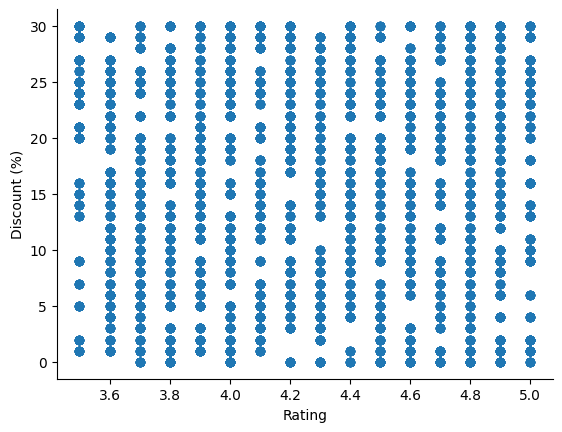

In [ ]:
# @title Rating vs Discount (%)

from matplotlib import pyplot as plt
numerical_df.plot(kind='scatter', x='Rating', y='Discount (%)', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

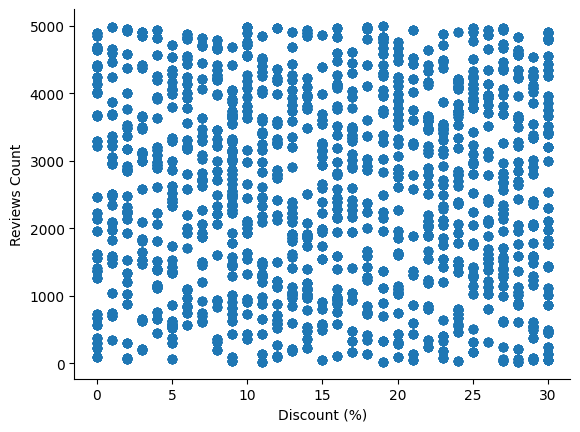

In [ ]:
# @title Discount (%) vs Reviews Count

from matplotlib import pyplot as plt
numerical_df.plot(kind='scatter', x='Discount (%)', y='Reviews Count', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

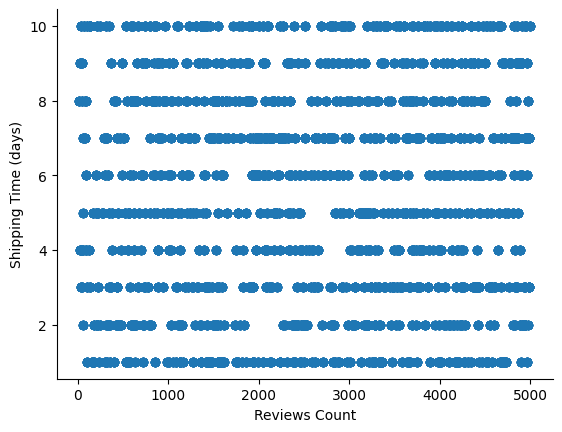

In [ ]:
# @title Reviews Count vs Shipping Time (days)

from matplotlib import pyplot as plt
numerical_df.plot(kind='scatter', x='Reviews Count', y='Shipping Time (days)', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

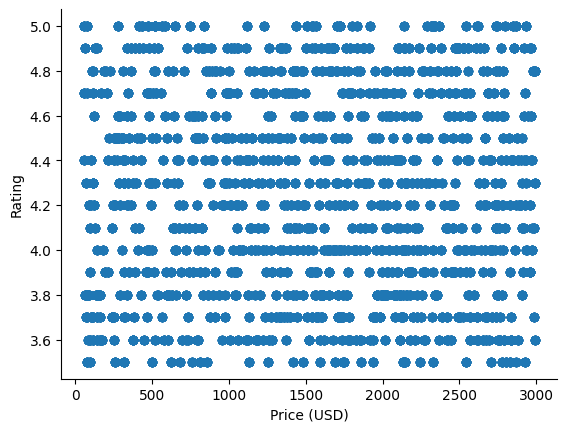

In [ ]:
# @title Price (USD) vs Rating

from matplotlib import pyplot as plt
numerical_df.plot(kind='scatter', x='Price (USD)', y='Rating', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

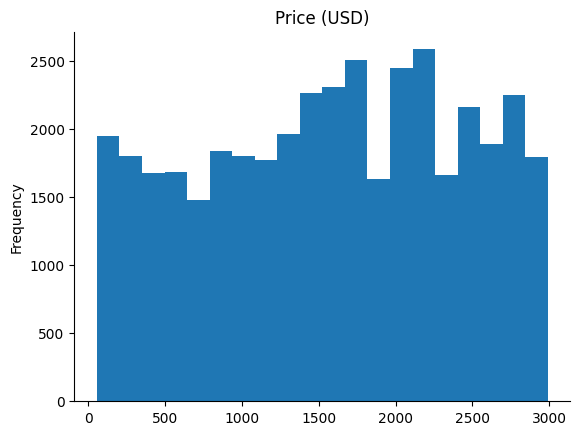

In [ ]:
# @title Price (USD)

from matplotlib import pyplot as plt
numerical_df['Price (USD)'].plot(kind='hist', bins=20, title='Price (USD)')
plt.gca().spines[['top', 'right',]].set_visible(False)

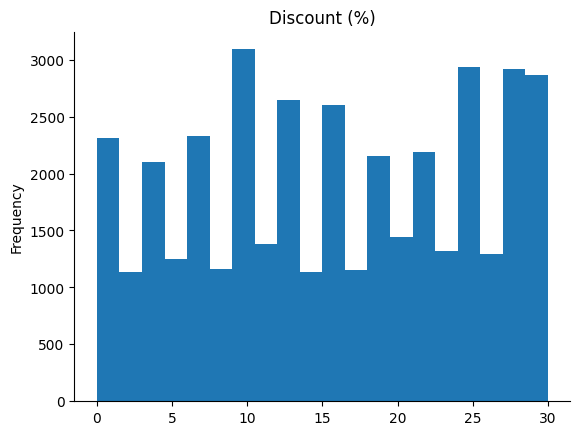

In [ ]:
# @title Discount (%)

from matplotlib import pyplot as plt
numerical_df['Discount (%)'].plot(kind='hist', bins=20, title='Discount (%)')
plt.gca().spines[['top', 'right',]].set_visible(False)

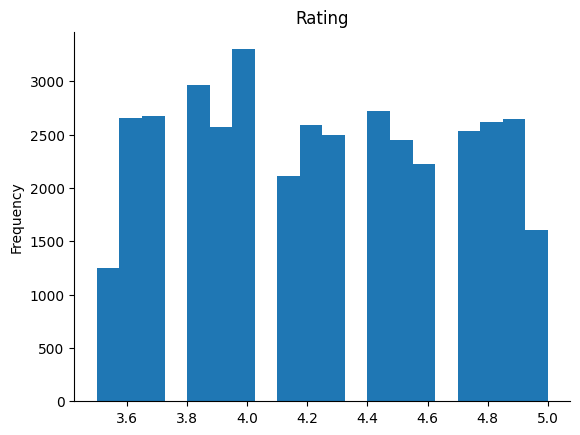

In [ ]:
# @title Rating

from matplotlib import pyplot as plt
numerical_df['Rating'].plot(kind='hist', bins=20, title='Rating')
plt.gca().spines[['top', 'right',]].set_visible(False)

# **WEEK 2 Key Variables Analysis (KVP)**

# **KVP1: Demand Analysis**

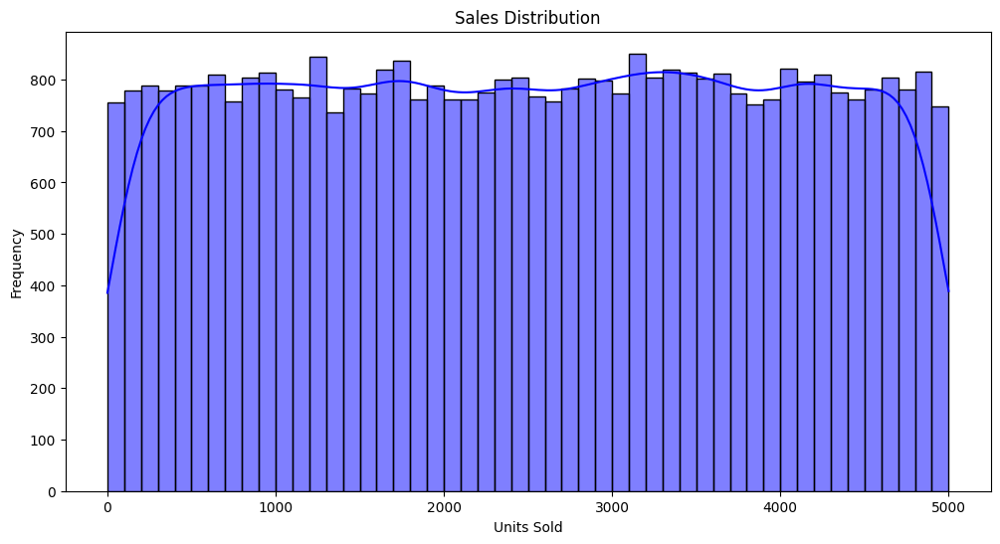

In [ ]:
## KVP1: Demand Analysis
plt.figure(figsize=(12, 6))
sns.histplot(df['Sales (Units Sold)'], bins=50, kde=True, color='blue')
plt.title('Sales Distribution')
plt.xlabel('Units Sold')
plt.ylabel('Frequency')
plt.show()


# **Top 10 Best-Selling Products**

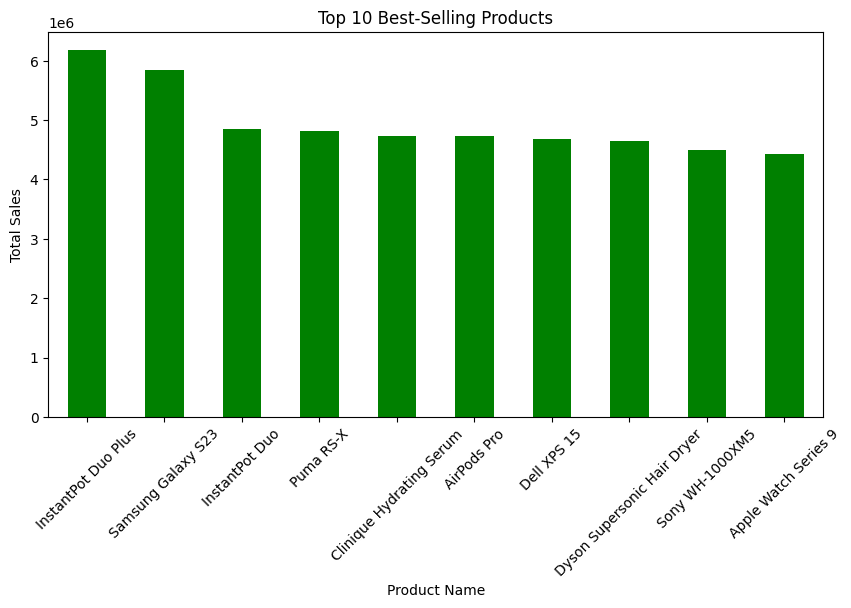

In [ ]:
# Top 10 Best-Selling Products
top_products = df.groupby('Product Name')['Sales (Units Sold)'].sum().nlargest(10)
top_products.plot(kind='bar', color='green', figsize=(10, 5))
plt.title('Top 10 Best-Selling Products')
plt.xlabel('Product Name')
plt.ylabel('Total Sales')
plt.xticks(rotation=45)
plt.show()

# **KVP2: Competitor Analysis**

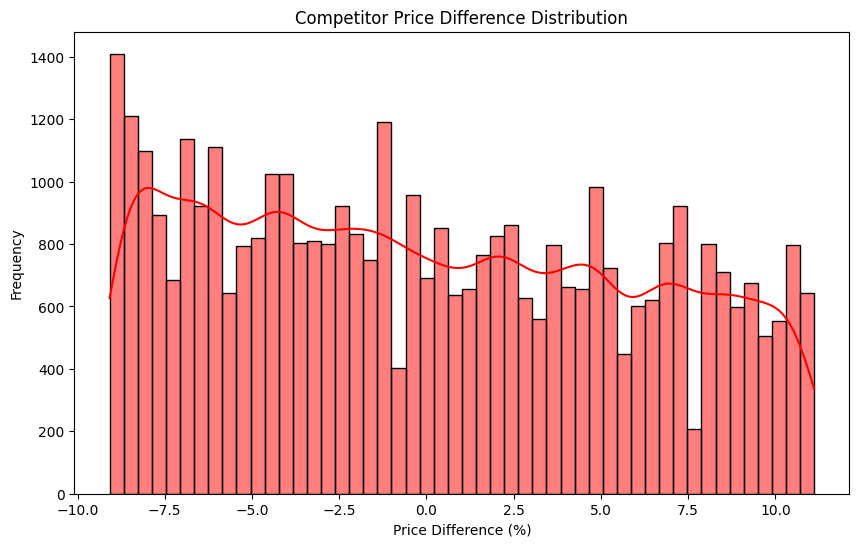

In [ ]:
## KVP2: Competitor Analysis
plt.figure(figsize=(10, 6))
sns.histplot(df['Competitor Price Difference (%)'], bins=50, kde=True, color='red')
plt.title('Competitor Price Difference Distribution')
plt.xlabel('Price Difference (%)')
plt.ylabel('Frequency')
plt.show()

# **Average Competitor Price vs. Product Price**

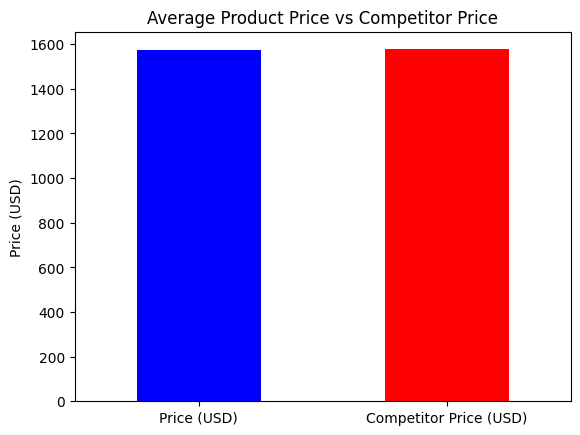

In [ ]:
# Average Competitor Price vs. Product Price
comp_price_comparison = df[['Price (USD)', 'Competitor Price (USD)']].mean()
comp_price_comparison.plot(kind='bar', color=['blue', 'red'])
plt.title('Average Product Price vs Competitor Price')
plt.ylabel('Price (USD)')
plt.xticks(rotation=0)
plt.show()

# **KVP3: Data Type Conversions**

In [ ]:
## KVP3: Data Type Conversions
# Convert relevant categorical variables to category type
df['Stock Availability'] = df['Stock Availability'].astype('category')
df['Seasonality Impact'] = df['Seasonality Impact'].astype('category')
df['Competitor Stock Availability'] = df['Competitor Stock Availability'].astype('category')

# **Convert price columns to float**

In [ ]:
# Convert price columns to float
df['Price (USD)'] = df['Price (USD)'].astype(float)
df['Competitor Price (USD)'] = df['Competitor Price (USD)'].astype(float)
df['Discounted Price (USD)'] = df['Discounted Price (USD)'].astype(float)

In [ ]:
df.dtypes

,0
Product Name,object
Category,object
Price (USD),float64
Rating,float64
Stock Availability,category
Discount (%),int64
Brand,object
Reviews Count,int64
Shipping Time (days),int64
Return Policy,object


In [ ]:
# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Categorical columns to encode
categorical_columns = ['Category', 'Brand', 'Stock Availability', 'Return Policy', 'Competitor Name', 'Competitor Stock Availability']

# Apply LabelEncoder to each column
for col in categorical_columns:
    if col in df.columns:  # Indented this line to be part of the loop
        df[col] = label_encoder.fit_transform(df[col])

# Show the transformed dataframe
print(df.head())

      Product Name  Category  Price (USD)  Rating  Stock Availability  \
0  Sony WH-1000XM5         4       112.85     3.7                   0   
1  Sony WH-1000XM5         4       112.85     3.7                   0   
2  Sony WH-1000XM5         4       112.85     3.7                   0   
3  Sony WH-1000XM5         4       112.85     3.7                   0   
4  Sony WH-1000XM5         4       112.85     3.7                   0   

   Discount (%)  Brand  Reviews Count  Shipping Time (days)  Return Policy  \
0            12     18           2745                     8              2   
1            12     18           2745                     8              2   
2            12     18           2745                     8              2   
3            12     18           2745                     8              2   
4            12     18           2745                     8              2   

   ...  Competitor Price Difference (%) Profit Margin (%)  \
0  ...                         

# **Calculate the minimum value for all columns**

In [ ]:
min_values = df.select_dtypes(exclude=['category']).min()
print("Minimum Values for Each Column:\n", min_values)

Minimum Values for Each Column:
 Product Name                       Adidas Ultraboost
Category                                           0
Price (USD)                                     55.8
Rating                                           3.5
Stock Availability                                 0
Discount (%)                                       0
Brand                                              0
Reviews Count                                     21
Shipping Time (days)                               1
Return Policy                                      0
Demand Index                                       1
Competitor Price Difference (%)                -9.08
Profit Margin (%)                              20.01
Customer Satisfaction (%)                         70
Supply Chain Efficiency (%)                       30
Competitor Name                                    0
Competitor Price (USD)                         56.42
Competitor Rating                                3.2
Competitor St

# **Calculate the maximum value for all columns**

In [ ]:
# Calculate the maximum value for all columns, excluding unordered categorical columns
max_values = df.select_dtypes(exclude=['category', 'object']).max()
print("Maximum Values for Each Column:\n", max_values)

Maximum Values for Each Column:
 Category                             11.00
Price (USD)                        2990.86
Rating                                5.00
Stock Availability                    1.00
Discount (%)                         30.00
Brand                                18.00
Reviews Count                      4999.00
Shipping Time (days)                 10.00
Return Policy                         2.00
Demand Index                        100.00
Competitor Price Difference (%)      11.11
Profit Margin (%)                    39.98
Customer Satisfaction (%)           100.00
Supply Chain Efficiency (%)         100.00
Competitor Name                       9.00
Competitor Price (USD)             3186.91
Competitor Rating                     5.50
Competitor Stock Availability         1.00
Sales (Units Sold)                 5000.00
Discounted Price (USD)             2965.05
dtype: float64


# **Walmart-API**

In [ ]:
import http.client

conn = http.client.HTTPSConnection("walmart-data.p.rapidapi.com")

headers = {
    'x-rapidapi-key': "2ab6aa1c26msh99cbdca2111eb1ap13df56jsn89409570906f",
    'x-rapidapi-host': "walmart-data.p.rapidapi.com"
}

conn.request("GET", "/walmart-serp.php?url=https%3A%2F%2Fwww.walmart.com%2Fsearch%3Fq%3Dsamsung%2Bgalaxy", headers=headers)

res = conn.getresponse()
data = res.read()

print(data.decode("utf-8"))

{"original_status":307,"pc_status":503,"url":"https://www.walmart.com/blocked?q=samsung+galaxy\u0026url=L3NlYXJjaD9xPXNhbXN1bmclMjBnYWxheHk%3D\u0026uuid=07bdf1a2-07b2-11f0-bfd7-08626be9b0f3\u0026vid=\u0026g=b","body":"Request failed, with status codes original_status: 200 and pc_status: 503. Please try the request again, as this one is not charged, or contact support if the problem persists. If you want close to 100% success, try our Crawler which is normally included in the same price: https://crawlbase.com/docs/crawler"}


# **Univariate Analysis**

Analyzes **one variable** at a time.

Understand distribution, central tendency, and spread of a single variable.

 **Histogram** 📊
 The code plots histograms with Kernel Density Estimation (KDE) to visualize the distribution of numerical columns.


Univariate Analysis:


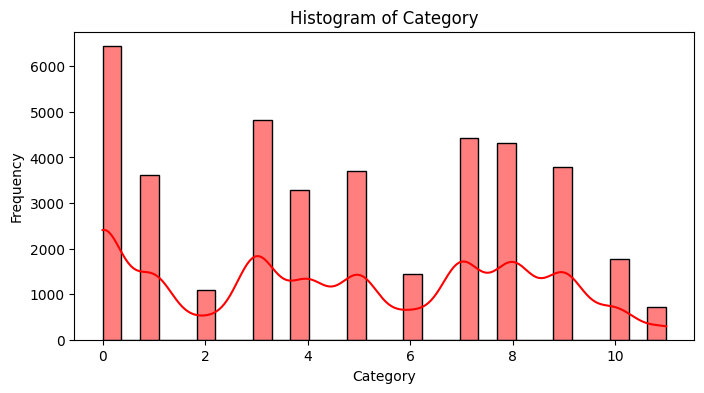

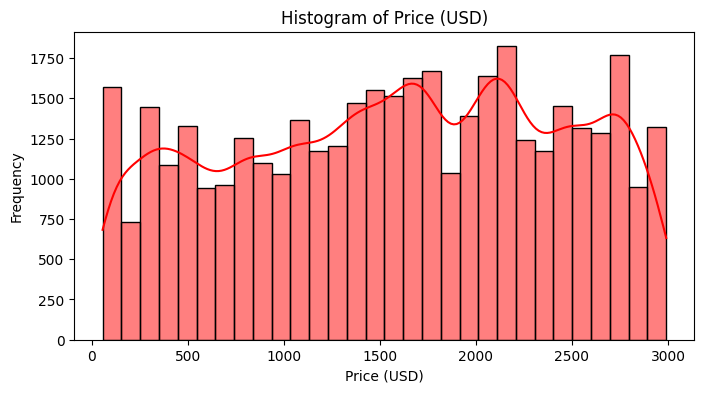

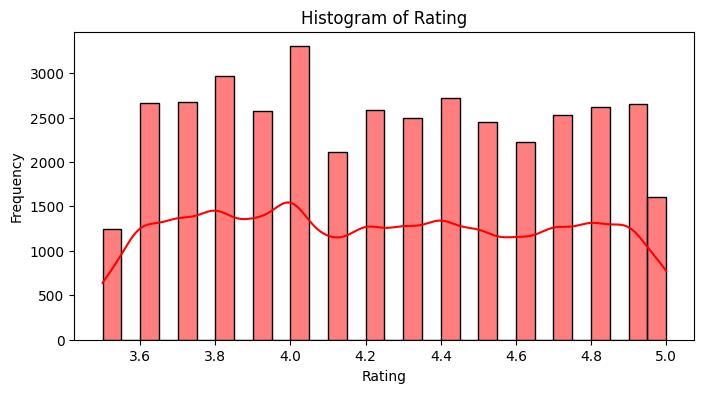

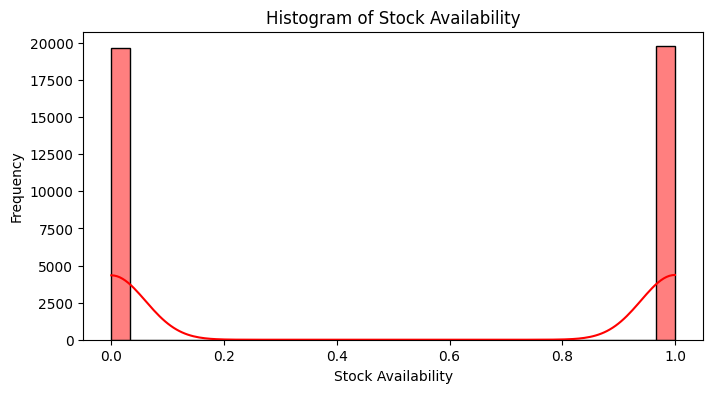

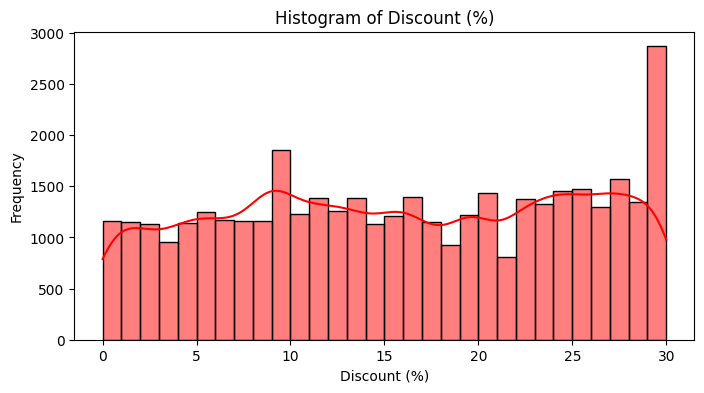

...

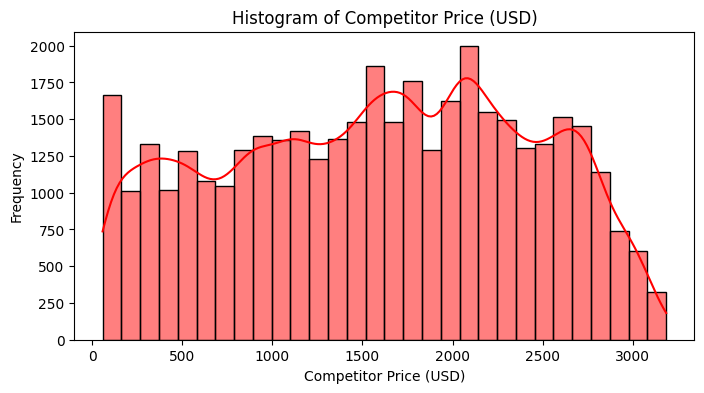

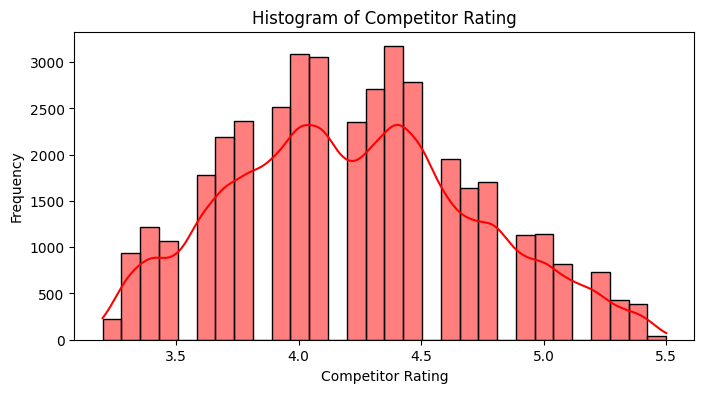

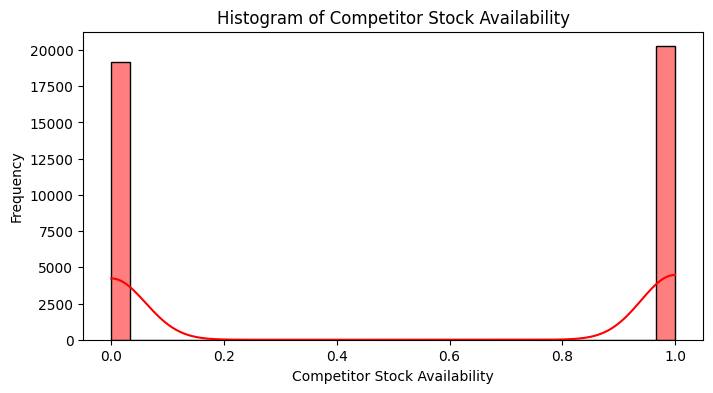

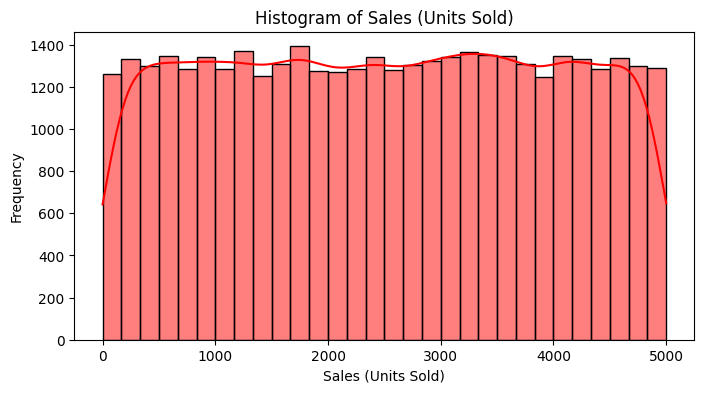

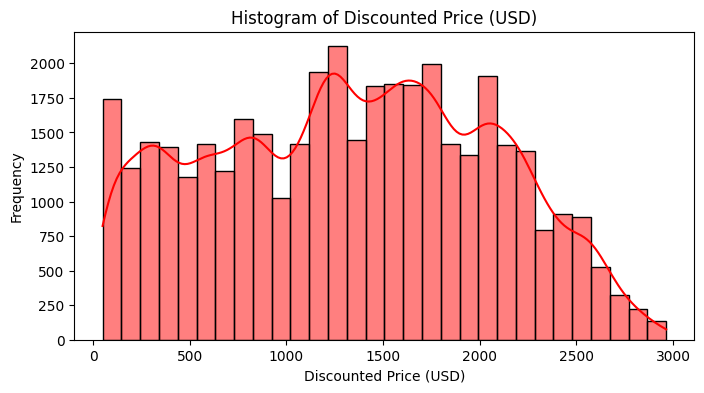

In [ ]:
# Univariate Analysis
print("\nUnivariate Analysis:")
num_cols = df.select_dtypes(include=['number']).columns
cat_cols = df.select_dtypes(include=['category', 'object']).columns

# Histograms for numerical columns
for col in num_cols:
    plt.figure(figsize=(8, 4))
    sns.histplot(df[col], bins=30, kde=True, color='Red')
    plt.title(f'Histogram of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

# **Identify categorical columns**
# **Bar plots for categorical columns**

<ipython-input-169-926d40ecc374>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=df[col], data=df, palette='viridis')  # Corrected syntax


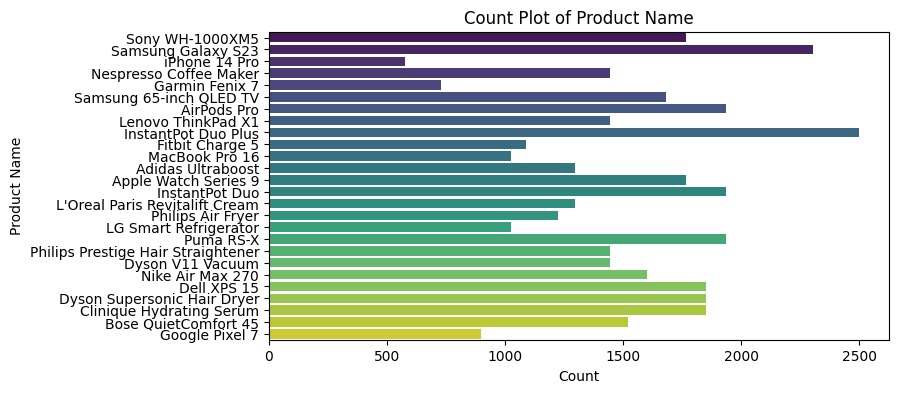

<ipython-input-169-926d40ecc374>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=df[col], data=df, palette='viridis')  # Corrected syntax


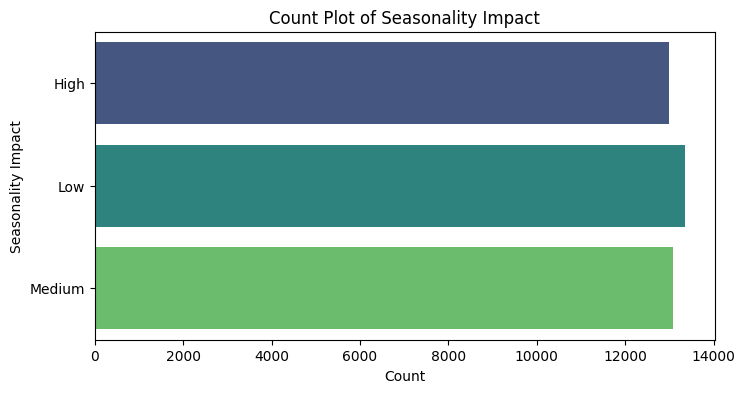

In [ ]:
# Identify categorical columns
cat_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()

# Bar plots for categorical columns
for col in cat_cols:
    plt.figure(figsize=(8, 4))
    sns.countplot(y=df[col], data=df, palette='viridis')  # Corrected syntax
    plt.title(f'Count Plot of {col}')
    plt.xlabel('Count')
    plt.ylabel(col)
    plt.show()

# **Bivariate Analysis**
Analyzes **two variables** to study **relationships**

Identify correlation, patterns, or dependencies between two variables.

Scatter Plot 📉

The plot automatically generates scatter plots for each pair of numerical variables. This helps in understanding if there's a correlation between any two variables.


Bivariate Analysis:


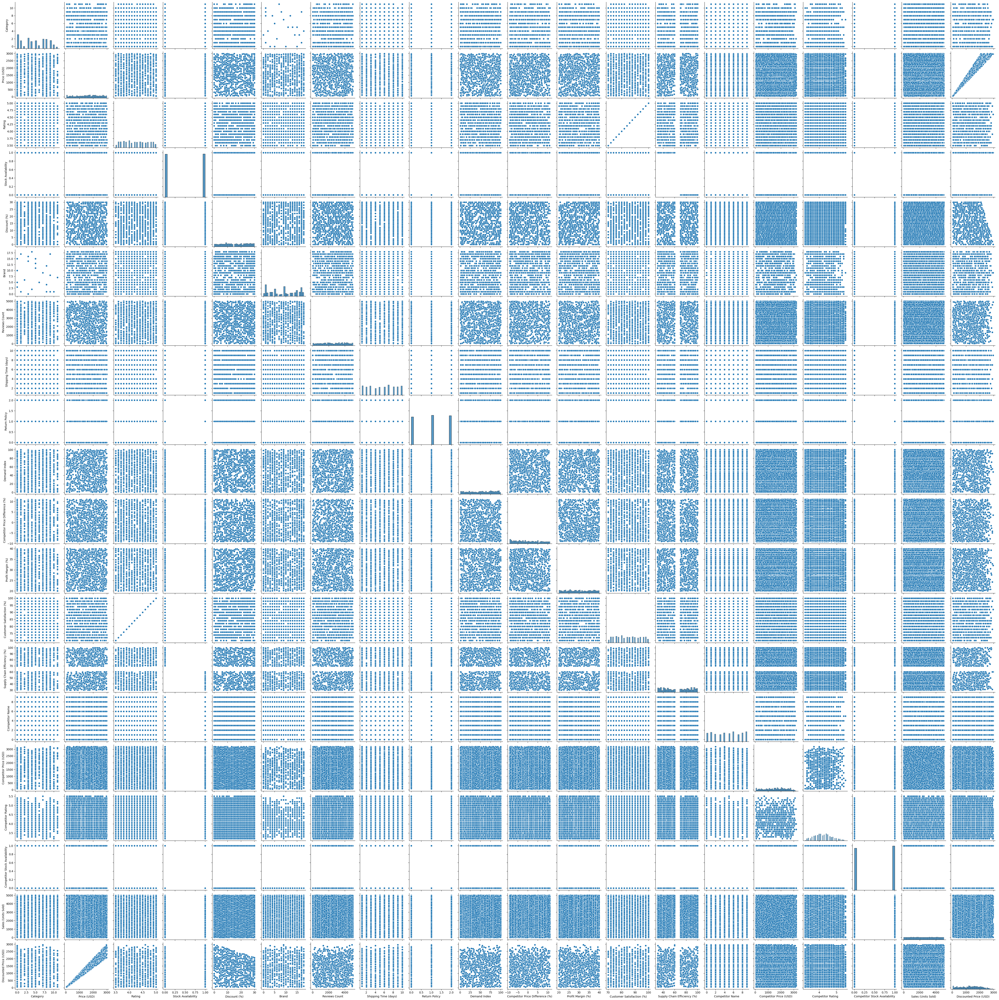

In [ ]:
# Bivariate Analysis
print("\nBivariate Analysis:")
# Scatter plots for numerical variables
sns.pairplot(df[num_cols])
plt.show()


# **WEEK 3**


# **Identifying Key Factors Affecting Demand**
# **Correlation heatmap**
The sns.heatmap(df[num_cols].corr()) generates a correlation heatmap that visually represents the relationship between numerical variables in the dataset. It helps in identifying which variables are positively or negatively correlated.

The value ranges from -1 to +1:

+1 indicates a perfect positive correlation (as one variable increases, the other does as well).

-1 indicates a perfect negative correlation (as one variable increases, the other decreases).
0 indicates no correlation.

High **positive correlations** are displayed in **red**, while **negative correlations appear in blue**.

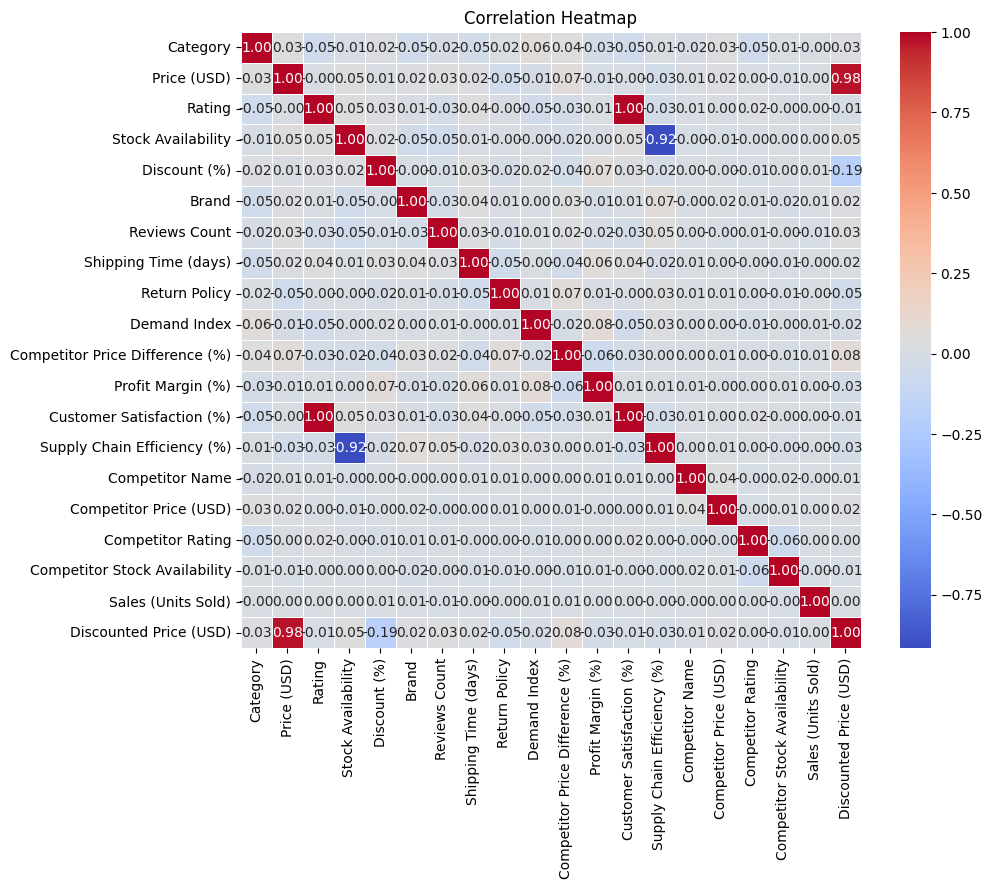

In [ ]:
# Correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(df[num_cols].corr(), annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

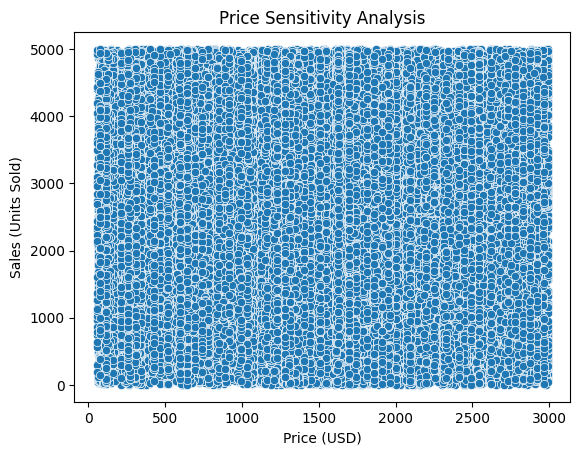

In [ ]:
# Price sensitivity analysis (Price vs. Sales)
sns.scatterplot(x='Price (USD)', y='Sales (Units Sold)', data=df)
plt.title('Price Sensitivity Analysis')
plt.xlabel('Price (USD)')
plt.ylabel('Sales (Units Sold)')
plt.show()

# **Box plots for numerical vs categorical**

<ipython-input-174-0d3d58d2f441>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Stock Availability', y=df[col], data=df, palette='coolwarm')


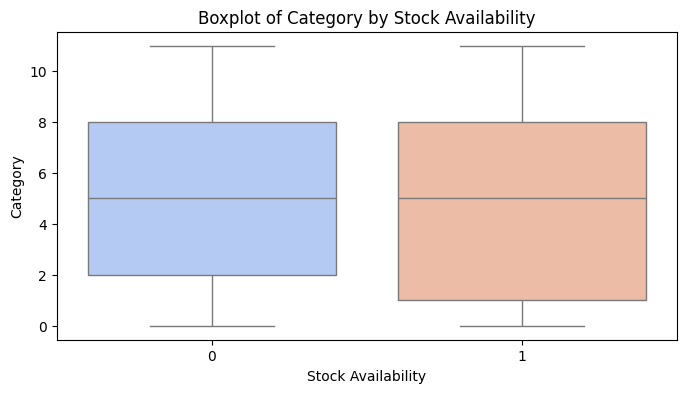

<ipython-input-174-0d3d58d2f441>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Stock Availability', y=df[col], data=df, palette='coolwarm')


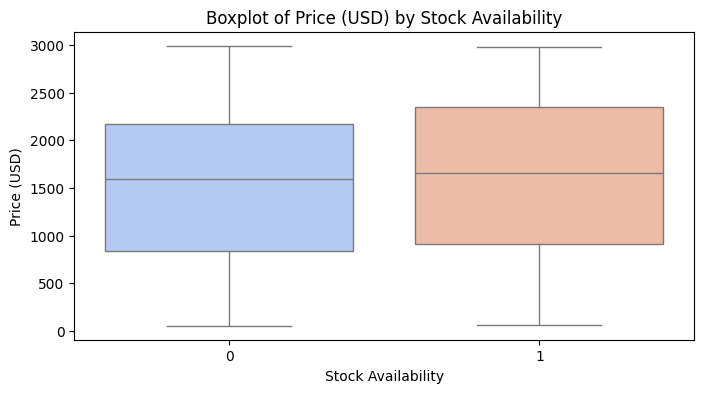

<ipython-input-174-0d3d58d2f441>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Stock Availability', y=df[col], data=df, palette='coolwarm')


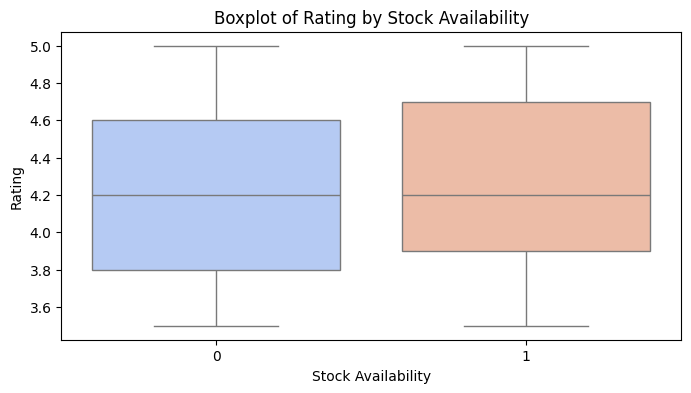

<ipython-input-174-0d3d58d2f441>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Stock Availability', y=df[col], data=df, palette='coolwarm')


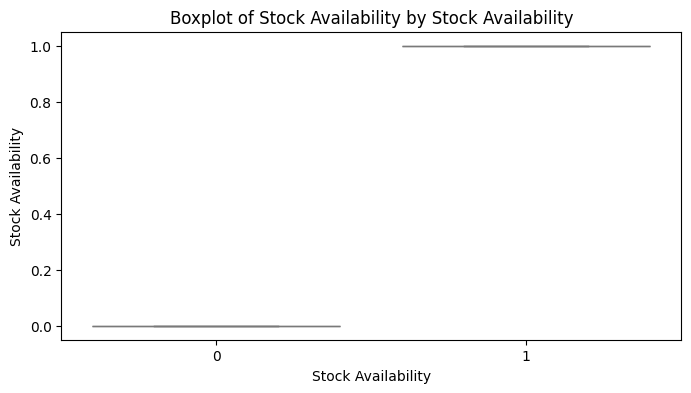

<ipython-input-174-0d3d58d2f441>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Stock Availability', y=df[col], data=df, palette='coolwarm')


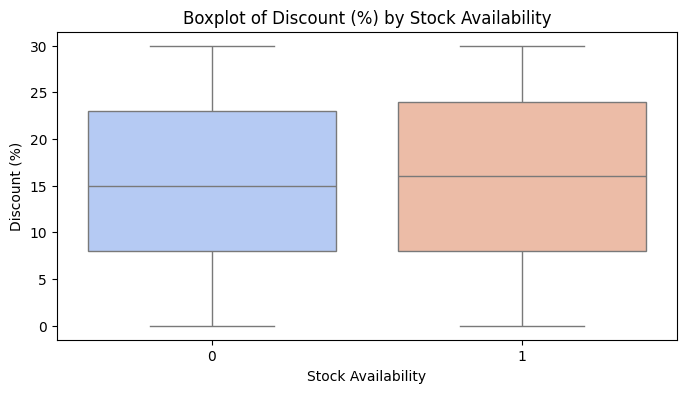

<ipython-input-174-0d3d58d2f441>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Stock Availability', y=df[col], data=df, palette='coolwarm')


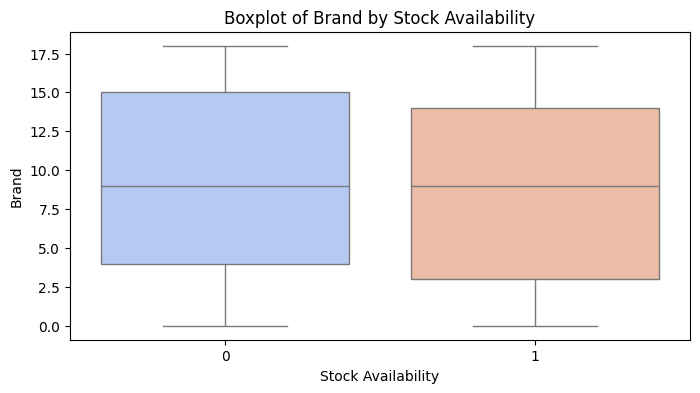

<ipython-input-174-0d3d58d2f441>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Stock Availability', y=df[col], data=df, palette='coolwarm')


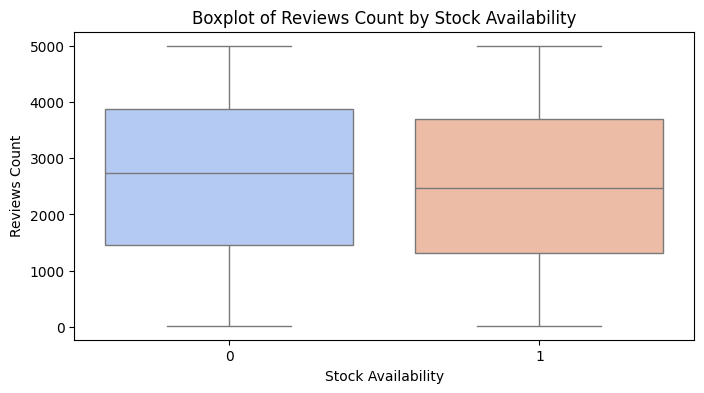

<ipython-input-174-0d3d58d2f441>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Stock Availability', y=df[col], data=df, palette='coolwarm')


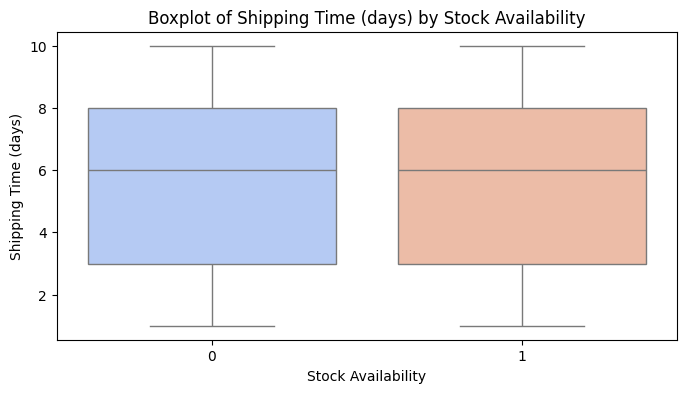

<ipython-input-174-0d3d58d2f441>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Stock Availability', y=df[col], data=df, palette='coolwarm')


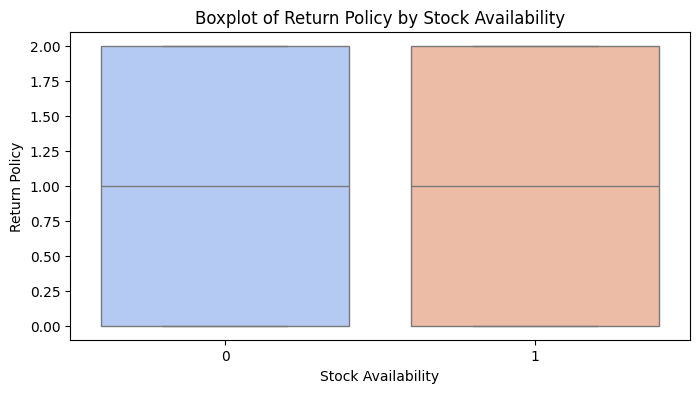

<ipython-input-174-0d3d58d2f441>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Stock Availability', y=df[col], data=df, palette='coolwarm')


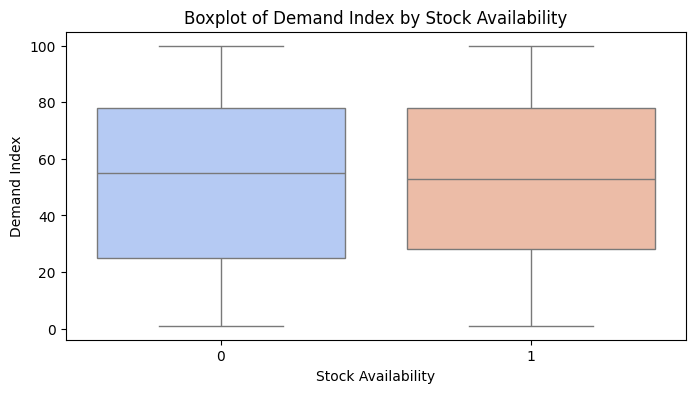

<ipython-input-174-0d3d58d2f441>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Stock Availability', y=df[col], data=df, palette='coolwarm')


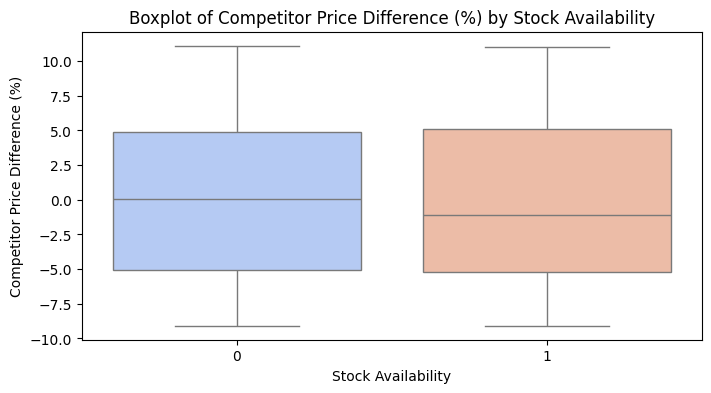

<ipython-input-174-0d3d58d2f441>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Stock Availability', y=df[col], data=df, palette='coolwarm')


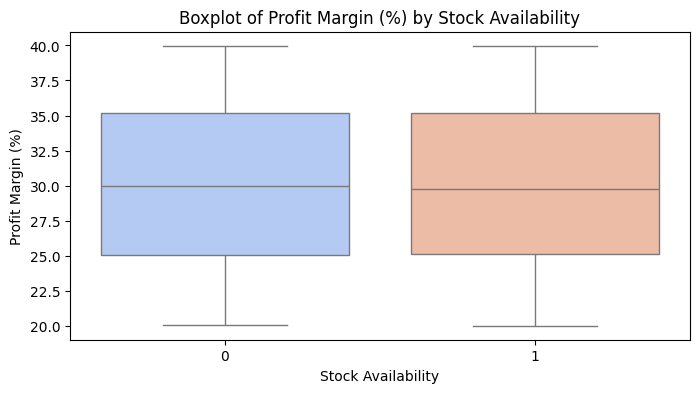

<ipython-input-174-0d3d58d2f441>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Stock Availability', y=df[col], data=df, palette='coolwarm')


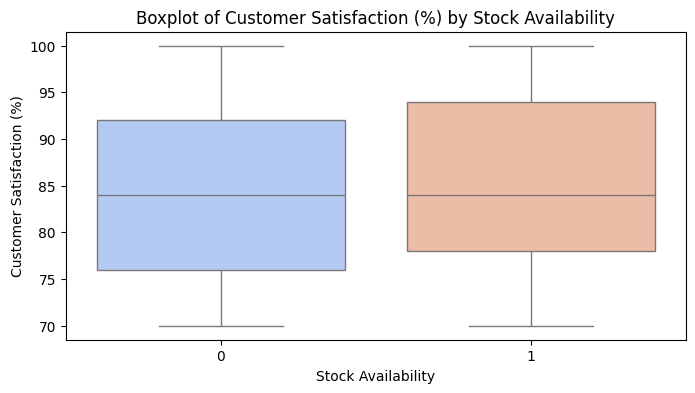

<ipython-input-174-0d3d58d2f441>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Stock Availability', y=df[col], data=df, palette='coolwarm')


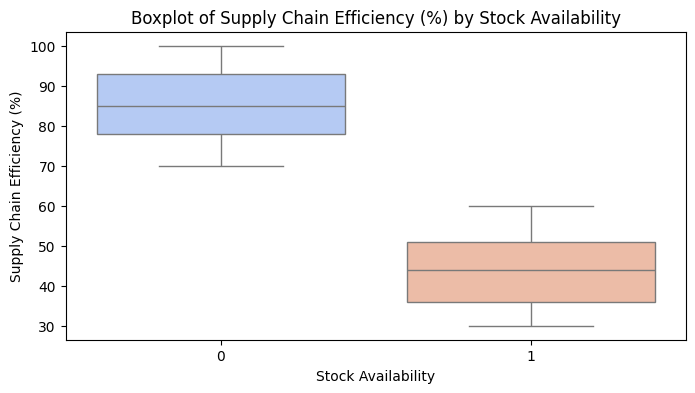

<ipython-input-174-0d3d58d2f441>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Stock Availability', y=df[col], data=df, palette='coolwarm')


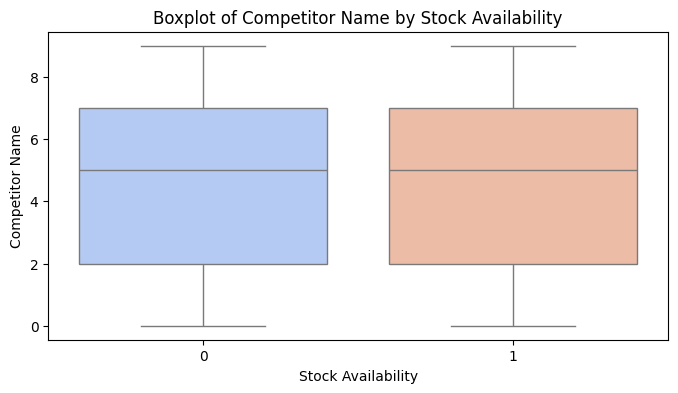

<ipython-input-174-0d3d58d2f441>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Stock Availability', y=df[col], data=df, palette='coolwarm')


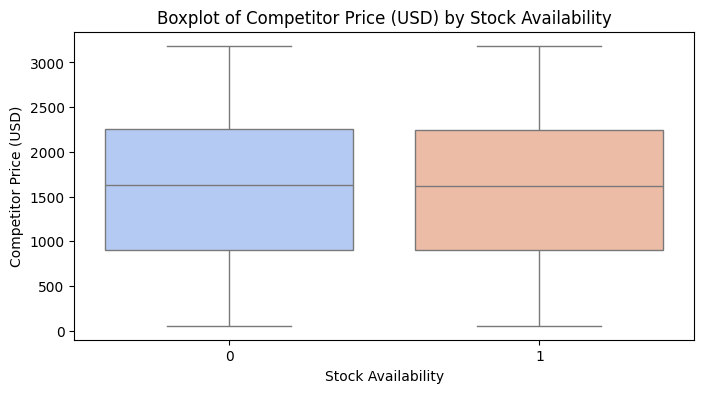

<ipython-input-174-0d3d58d2f441>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Stock Availability', y=df[col], data=df, palette='coolwarm')


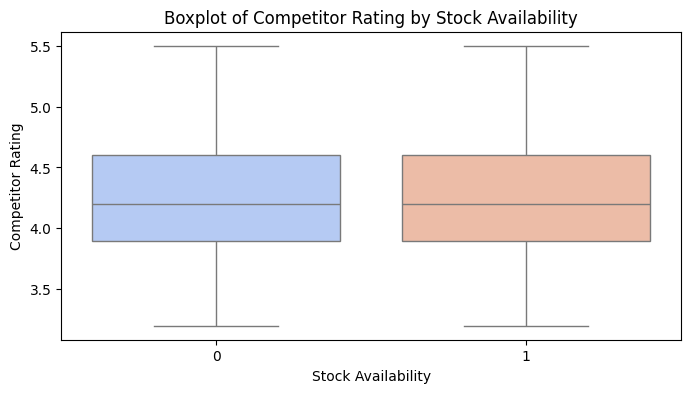

<ipython-input-174-0d3d58d2f441>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Stock Availability', y=df[col], data=df, palette='coolwarm')


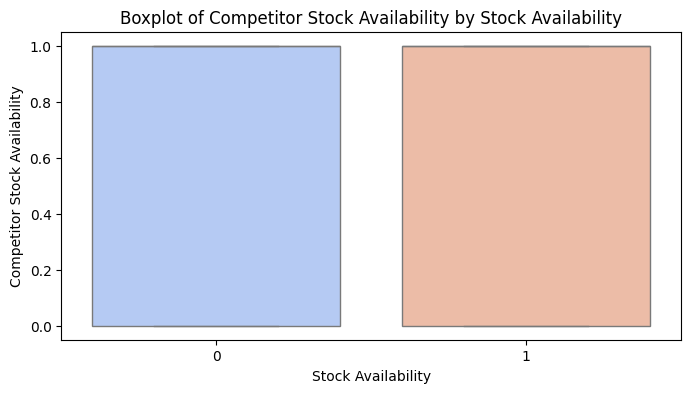

<ipython-input-174-0d3d58d2f441>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Stock Availability', y=df[col], data=df, palette='coolwarm')


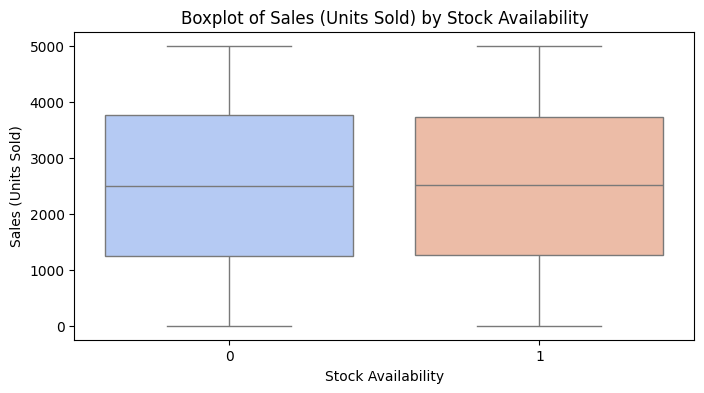

<ipython-input-174-0d3d58d2f441>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Stock Availability', y=df[col], data=df, palette='coolwarm')


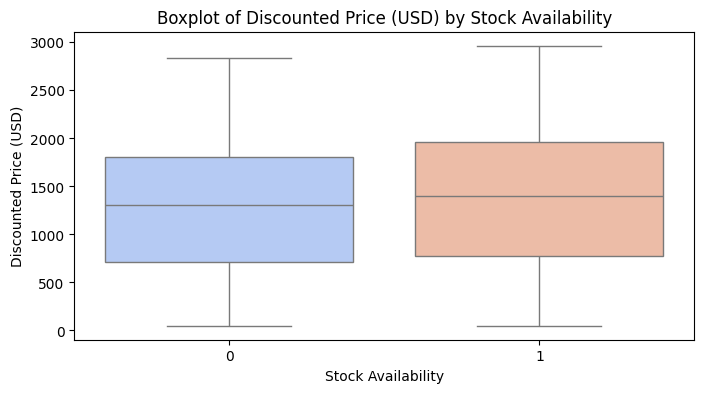

In [ ]:
# Box plots for numerical vs categorical
for col in num_cols:
    plt.figure(figsize=(8, 4))
    sns.boxplot(x='Stock Availability', y=df[col], data=df, palette='coolwarm')
    plt.title(f'Boxplot of {col} by Stock Availability')
    plt.show()

# **Model Building (MB)**


# **MB1: Algorithm Selection and Feature Engineering**

In [ ]:
# Select features and target variable
X = df[['Price (USD)', 'Sales (Units Sold)', 'Competitor Price (USD)', 'Stock Availability', 'Competitor Stock Availability']]
y = df['Discounted Price (USD)']  # assuming discounted price is the target variable

In [ ]:
# Convert categorical variables to numerical using one-hot encoding
X = pd.get_dummies(X, drop_first=True)

In [ ]:
# Scaling the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [ ]:
# Train-test split (80-20)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# **MB2: Model Training**


# ***Linear Regression Model***


In [ ]:
## MB2: Model Training
# Linear Regression Model
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

LinearRegression()

In [ ]:
# Make predictions
y_pred_lr = lr_model.predict(X_test)

# Evaluate the model
mae_lr = mean_absolute_error(y_test, y_pred_lr)
mse_lr = mean_squared_error(y_test, y_pred_lr)
rmse_lr = np.sqrt(mse_lr)
r2_lr = r2_score(y_test, y_pred_lr)

print(f"Linear Regression Model Evaluation:\nMAE: {mae_lr}\nMSE: {mse_lr}\nRMSE: {rmse_lr}\nR2: {r2_lr}\n")

# Display accuracy percentage
accuracy_percentage = r2_lr * 100
print(f'Linear Regression Accuracy: {accuracy_percentage:.2f}%')


Linear Regression Model Evaluation:
MAE: 123.9340850766149
MSE: 25835.993293266063
RMSE: 160.73578722010248
R2: 0.9498612615856368

Linear Regression Accuracy: 94.99%


# ***Random Forest Regression Model***

---


Random Forest Regression is an ensemble learning technique that builds multiple decision trees and averages their outputs for better accuracy.

It reduces overfitting and improves prediction reliability.

In [ ]:
# Random Forest Regressor Model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

In [ ]:
# Make predictions
y_pred_rf = rf_model.predict(X_test)

# Evaluate the model
mae_rf = mean_absolute_error(y_test, y_pred_rf)
mse_rf = mean_squared_error(y_test, y_pred_rf)
rmse_rf = np.sqrt(mse_rf)
r2_rf = r2_score(y_test, y_pred_rf)

print(f"Random Forest Model Evaluation:\nMAE: {mae_rf}\nMSE: {mse_rf}\nRMSE: {rmse_rf}\nR2: {r2_rf}\n")

# Display Accuracy Percentage
accuracy_percentage_rf = r2_rf * 100  # Multiply R² by 100 to get accuracy percentage
print(f"Random Forest Model Accuracy: {accuracy_percentage_rf:.2f}%")

Random Forest Model Evaluation:
MAE: 0.25741640558178625
MSE: 14.932942036201721
RMSE: 3.864316503109149
R2: 0.9999710203178174

Random Forest Model Accuracy: 100.00%


# **Cross-validation for Random Forest Model**

In [ ]:
# Cross-validation for Random Forest Model
cv_scores_rf = cross_val_score(rf_model, X_scaled, y, cv=5)
print(f"Random Forest Cross-Validation Scores: {cv_scores_rf}")
print(f"Random Forest Average Cross-Validation Score: {cv_scores_rf.mean()}\n")

Random Forest Cross-Validation Scores: [0.88686613 0.92114499 0.89286276 0.91023833 0.89149865]
Random Forest Average Cross-Validation Score: 0.9005221718966965



# **Feature importance from Random Forest**

In [ ]:
# Feature importance from Random Forest
feature_importance = rf_model.feature_importances_
feature_names = X.columns
feature_imp_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importance
}).sort_values(by='Importance', ascending=False)

print("\nFeature Importance from Random Forest:")
print(feature_imp_df)


Feature Importance from Random Forest:
                         Feature  Importance
0                    Price (USD)    0.995470
3             Stock Availability    0.004466
1             Sales (Units Sold)    0.000034
2         Competitor Price (USD)    0.000029
4  Competitor Stock Availability    0.000002


# **Visualization of feature importance**



1.rf_model.feature_importances_ extracts feature importance scores from the trained model.

2.Sorting the features helps in identifying the most influential ones.
Visualization:

3.The bar chart shows which features impact predictions the most.
The most important features appear at the top.

<ipython-input-191-05c051ae8df8>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=feature_imp_df, palette='viridis')


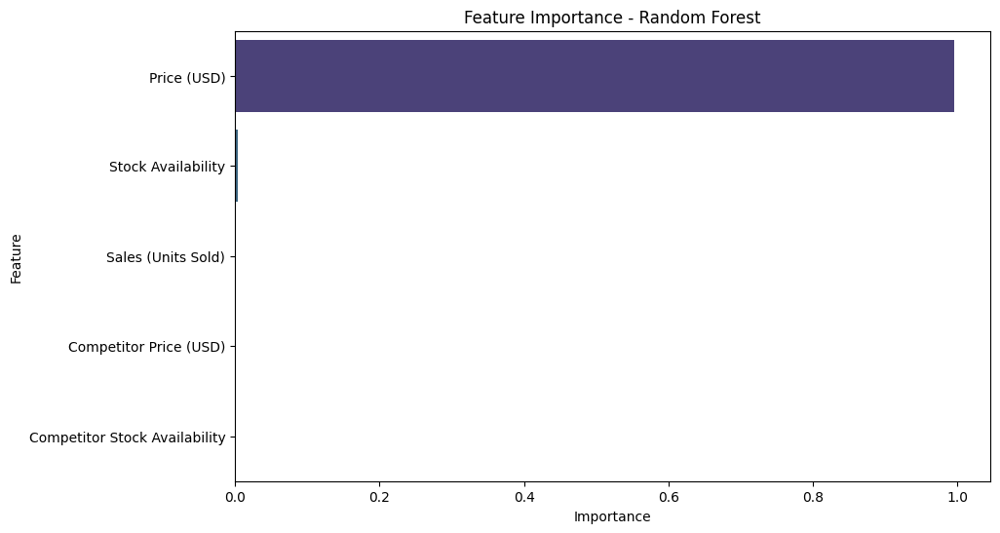

In [ ]:
# Visualization of feature importance
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_imp_df, palette='viridis')
plt.title('Feature Importance - Random Forest')
plt.show()

In [ ]:
# Comparison of Model Performances
model_comparison = pd.DataFrame({
    'Model': ['Linear Regression', 'Random Forest'],
    'R2 Score': [r2_lr, r2_rf],
    'RMSE': [rmse_lr, rmse_rf]
})

In [ ]:
print("\nModel Comparison:")
print(model_comparison)


Model Comparison:
               Model  R2 Score        RMSE
0  Linear Regression  0.949861  160.735787
1      Random Forest  0.999972    3.812004


# ***Support Vector Machine (SVR) Model***

1. code to implement a Support Vector Machine (SVM) for regression (SVR) to predict the target variable (Discounted Price (USD) in this case)
2.code will train an SVM model and evaluate its performance using MAE, MSE, RMSE, and R² scores.



In [ ]:
# Support Vector Machine (SVR) Model
svm_model = SVR(kernel='rbf')  # Radial Basis Function kernel
svm_model.fit(X_train, y_train)


SVR()

In [ ]:
# Make predictions
y_pred_svm = svm_model.predict(X_test)

In [ ]:
# Evaluate the model
mae_svm = mean_absolute_error(y_test, y_pred_svm)
mse_svm = mean_squared_error(y_test, y_pred_svm)
rmse_svm = np.sqrt(mse_svm)
r2_svm = r2_score(y_test, y_pred_svm)

print(f"SVM Model Evaluation:\nMAE: {mae_svm}\nMSE: {mse_svm}\nRMSE: {rmse_svm}\nR2: {r2_svm}\n")

# Calculate and display accuracy percentage (using R-squared score)
accuracy_percentage = r2_svm * 100
print(f"SVM Model Accuracy: {accuracy_percentage:.2f}%")

SVM Model Evaluation:
MAE: 173.27055595842145
MSE: 52951.3157201085
RMSE: 230.11152887265013
R2: 0.89723978724368

SVM Model Accuracy: 89.72%


# ***XGBoost Model***
XGBoost is implemented using XGBRegressor from the xgboost package.


1.  XGBoost is implemented using XGBRegressor from the xgboost package.

1.   The hyperparameters such as n_estimators, max_depth, and learning_rate can be tuned for better performance.
2.   Scaling is applied to the features using StandardScaler.

2.   Train-test split is used with 80% of the data for training and 20% for testing.



In [ ]:
# XGBoost Model
xg_reg = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, max_depth=5, learning_rate=0.1)
xg_reg.fit(X_train, y_train)


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [ ]:
# Make predictions
y_pred_xgb = xg_reg.predict(X_test)

In [ ]:
# Evaluate the model
mae_xgb = mean_absolute_error(y_test, y_pred_xgb)
mse_xgb = mean_squared_error(y_test, y_pred_xgb)
rmse_xgb = np.sqrt(mse_xgb)
r2_xgb = r2_score(y_test, y_pred_xgb)

print(f"XGBoost Model Evaluation:\nMAE: {mae_xgb}\nMSE: {mse_xgb}\nRMSE: {rmse_xgb}\nR2: {r2_xgb}\n")

accuracy_percentage = r2_xgb * 100
print(f"XGBoost Model Accuracy: {accuracy_percentage:.2f}%")

XGBoost Model Evaluation:
MAE: 104.44995739578663
MSE: 18352.567225938576
RMSE: 135.47164731388844
R2: 0.9643840065706634

XGBoost Model Accuracy: 96.44%


# ***Lasso Regression Model***
Alpha in Lasso Regression: Controls how much the model's complexity is limited. A higher alpha means more regularization (simpler model), while a lower alpha means less regularization (fitting the data more closely).

Scaling with StandardScaler: Adjusts the features so that they have a similar scale (mean of 0, standard deviation of 1). This ensures that no feature dominates the model just because its values are larger.

In [ ]:
# Lasso Regression Model
lasso = Lasso(alpha=0.1)  # You can adjust the alpha parameter to control regularization strength
lasso.fit(X_train, y_train)



Lasso(alpha=0.1)

In [ ]:
# Make predictions
y_pred_lasso = lasso.predict(X_test)

# Evaluate the model
mae_lasso = mean_absolute_error(y_test, y_pred_lasso)
mse_lasso = mean_squared_error(y_test, y_pred_lasso)
rmse_lasso = np.sqrt(mse_lasso)
r2_lasso = r2_score(y_test, y_pred_lasso)

print(f"Lasso Regression Model Evaluation:\nMAE: {mae_lasso}\nMSE: {mse_lasso}\nRMSE: {rmse_lasso}\nR2: {r2_lasso}\n")

accuracy_percentage = r2_xgb * 100
print(f"Lasso regression Model Accuracy: {accuracy_percentage:.2f}%")

Lasso Regression Model Evaluation:
MAE: 1112317.458473982
MSE: 1573107499416.1284
RMSE: 1254235.822888235
R2: -3052857.2553648516

Lasso regression Model Accuracy: 96.44%


# ***LightGBM***
LightGBM is very fast and works well with large datasets. It’s optimized for speed and can handle high-dimensional data effectively.

Unlike other models, LightGBM grows trees in a leaf-wise manner, making the model more accurate with fewer trees.

It can handle categorical features directly without needing to convert them to one-hot encoding, saving time and preserving data relationships.

LightGBM automatically deals with missing values during training, so you don’t need to impute them beforehand.

In [ ]:
#Set the parameters for LightGBM model
params = {
    'objective': 'regression',  # For regression problem
    'metric': 'rmse',  # Root Mean Squared Error metric
    'boosting_type': 'gbdt',  # Gradient Boosting Decision Tree
    'num_leaves': 31,  # Number of leaves in one tree
    'learning_rate': 0.05,  # Learning rate for model optimization
    'feature_fraction': 0.9  # Randomly select part of features for building trees
}

In [ ]:
#Train the model with early stopping using a valid_sets parameter and callbacks
num_round = 100  # Number of boosting rounds
callbacks = [lgb.early_stopping(stopping_rounds=10)]

# Create LightGBM Datasets
train_data = lgb.Dataset(X_train, label=y_train)
test_data = lgb.Dataset(X_test, label=y_test)

# Now you can train the model
lgb_model = lgb.train(params, train_data, num_round, valid_sets=[test_data], callbacks=callbacks)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.047584 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 771
[LightGBM] [Info] Number of data points in the train set: 31539, number of used features: 5
[LightGBM] [Info] Start training from score 1326.912986
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's rmse: 130.389


In [ ]:
# Make predictions with the trained model
y_pred_lgb = lgb_model.predict(X_test, num_iteration=lgb_model.best_iteration)

#Evaluate the model
mae_lgb = mean_absolute_error(y_test, y_pred_lgb)
mse_lgb = mean_squared_error(y_test, y_pred_lgb)
rmse_lgb = np.sqrt(mse_lgb)
r2_lgb = r2_score(y_test, y_pred_lgb)


In [ ]:
# Step 11: Display the evaluation results
print(f"LightGBM Model Evaluation:")
print(f"MAE: {mae_lgb:.4f}")
print(f"MSE: {mse_lgb:.4f}")
print(f"RMSE: {rmse_lgb:.4f}")
print(f"R2: {r2_lgb:.4f}")

# Step 12: Display accuracy percentage
accuracy_percentage_lgb = r2_lgb * 100
print(f"LightGBM Model Accuracy: {accuracy_percentage_lgb:.2f}%")

LightGBM Model Evaluation:
MAE: 101.5782
MSE: 17001.2329
RMSE: 130.3888
R2: 0.9670
LightGBM Model Accuracy: 96.70%


# ***Store the accuracy of trained ML models in a dictionary ***

In [ ]:
# Print all accuracies at once
print(f"Linear Regression Accuracy: {accuracy_percentage_lr:.2f}%")
print(f"Random Forest Accuracy: {accuracy_percentage_rf:.2f}%")
print(f"SVM Accuracy: {accuracy_percentage_svm:.2f}%")
print(f"XGBoost Accuracy: {accuracy_percentage_xgb:.2f}%")
print(f"Lasso regression Model Accuracy: {accuracy_percentage:.2f}%")
print(f"LightGBM Accuracy: {accuracy_percentage_lgb:.2f}%")


Linear Regression Accuracy: 94.99%
Random Forest Accuracy: 100.00%
SVM Accuracy: 89.72%
XGBoost Accuracy: 96.44%
Lasso regression Model Accuracy: 96.44%
LightGBM Accuracy: 96.70%


# ***ANALYZE HISTORICAL DEMAND PATTERNS***

In [ ]:
import pandas as pd
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.dates as mdates
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
from sklearn.svm import SVR
import xgboost as xgb
from sklearn.linear_model import Lasso
import lightgbm as lgb
from sklearn.linear_model import Ridge
from xgboost import XGBRegressor # Import the XGBRegressor class

In [ ]:
file_path = "/content/historical_demand_dataset_final.xlsx"
df = pd.read_excel(file_path)

In [ ]:
print(df.columns)

Index(['Product Name', 'Category', 'Price (USD)', 'Discounted Price (USD)',
       'Sales (Units Sold)', 'Stock Availability', 'Competitor Price (USD)',
       'Competitor Stock Availability', 'Date'],
      dtype='object')


In [ ]:
#Summary Statistics
print("\nSummary Statistics:")
print(df[["Sales (Units Sold)", "Price (USD)", "Discounted Price (USD)", "Competitor Price (USD)"]].describe())


Summary Statistics:
       Sales (Units Sold)   Price (USD)  Discounted Price (USD)  \
count        39424.000000  39424.000000            39424.000000   
mean          2502.748123   1575.952539             1330.629255   
std           1440.325300    830.816654              718.769470   
min              0.000000     55.800000               49.093400   
25%           1253.750000    883.740000              745.757600   
50%           2507.000000   1620.760000             1340.310400   
75%           3737.000000   2247.490000             1894.151200   
max           5000.000000   2990.860000             2965.050000   

       Competitor Price (USD)  
count            39424.000000  
mean              1577.289892  
std                831.548800  
min                 56.420000  
25%                899.010000  
50%               1617.200000  
75%               2253.050000  
max               3186.910000  


In [ ]:
print(df.head())

      Product Name    Category  Price (USD)  Discounted Price (USD)  \
0  Sony WH-1000XM5  Headphones       112.85                  99.308   
1  Sony WH-1000XM5  Headphones       112.85                  99.308   
2  Sony WH-1000XM5  Headphones       112.85                  99.308   
3  Sony WH-1000XM5  Headphones       112.85                  99.308   
4  Sony WH-1000XM5  Headphones       112.85                  99.308   

   Sales (Units Sold) Stock Availability  Competitor Price (USD)  \
0                4010           In Stock                  113.42   
1                1465           In Stock                 1228.90   
2                 119           In Stock                  147.94   
3                3813           In Stock                 2142.34   
4                1436           In Stock                 1608.89   

  Competitor Stock Availability       Date  
0                      In Stock 2021-01-01  
1                  Out of Stock 2021-01-01  
2                      In Sto

In [ ]:
# Check for missing values
print("\nMissing values:")
print(df.isnull().sum())


Missing values:
Product Name                     0
Category                         0
Price (USD)                      0
Discounted Price (USD)           0
Sales (Units Sold)               0
Stock Availability               0
Competitor Price (USD)           0
Competitor Stock Availability    0
Date                             0
dtype: int64


In [ ]:
df.shape

(39424, 9)

In [ ]:
#Total Sales per Product

total_sales = df.groupby("Product Name")["Discounted Price (USD)"].sum().reset_index()
total_sales.rename(columns={"Discounted Price (USD)": "Total_Sales"}, inplace=True)

# Print top 15 products by total sales
print("Total Sales per Product:")
print(total_sales.sort_values(by="Total_Sales", ascending=False).head(15))

Total Sales per Product:
                   Product Name   Total_Sales
23           Samsung Galaxy S23  3.419429e+06
12          InstantPot Duo Plus  3.250914e+06
21                    Puma RS-X  2.618417e+06
1                   AirPods Pro  2.522742e+06
24              Sony WH-1000XM5  2.453695e+06
6   Dyson Supersonic Hair Dryer  2.383304e+06
4      Clinique Hydrating Serum  2.382594e+06
22      Samsung 65-inch QLED TV  2.285961e+06
2          Apple Watch Series 9  2.264579e+06
11               InstantPot Duo  2.199242e+06
5                   Dell XPS 15  2.195252e+06
7              Dyson V11 Vacuum  2.193155e+06
18             Nike Air Max 270  2.049607e+06
3          Bose QuietComfort 45  1.872811e+06
15           Lenovo ThinkPad X1  1.833328e+06


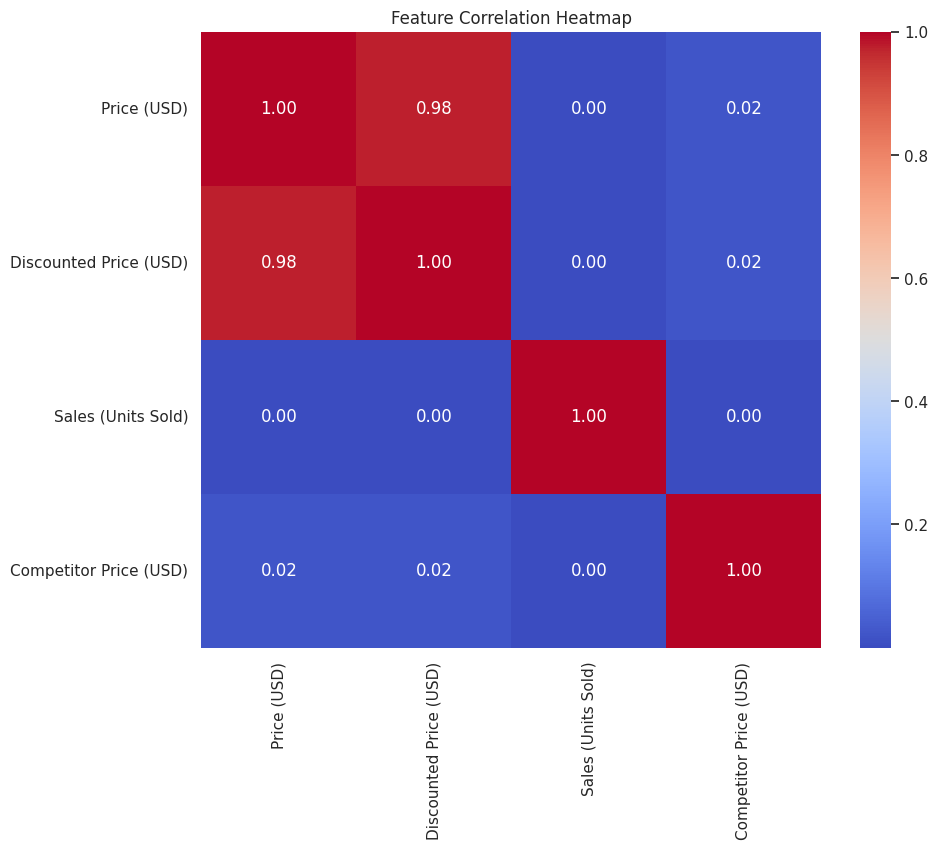

In [ ]:
# Correlation heatmap
plt.figure(figsize=(10,8))
# Select only numerical features for correlation analysis
numerical_df = df.select_dtypes(include=np.number)
sns.heatmap(numerical_df.corr(), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Feature Correlation Heatmap")
plt.show()

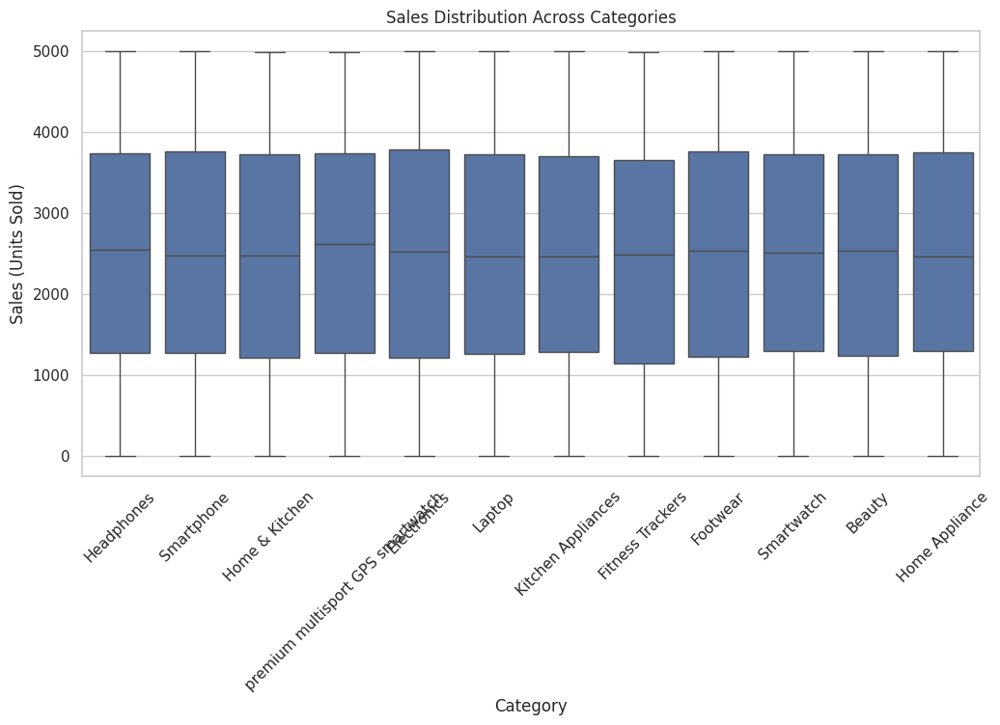

In [ ]:
#Set the figure style
sns.set(style="whitegrid")

#Sales Distribution Across Categories
plt.figure(figsize=(12, 6))
sns.boxplot(x="Category", y="Sales (Units Sold)", data=df)
plt.xticks(rotation=45)
plt.title("Sales Distribution Across Categories")
plt.show()

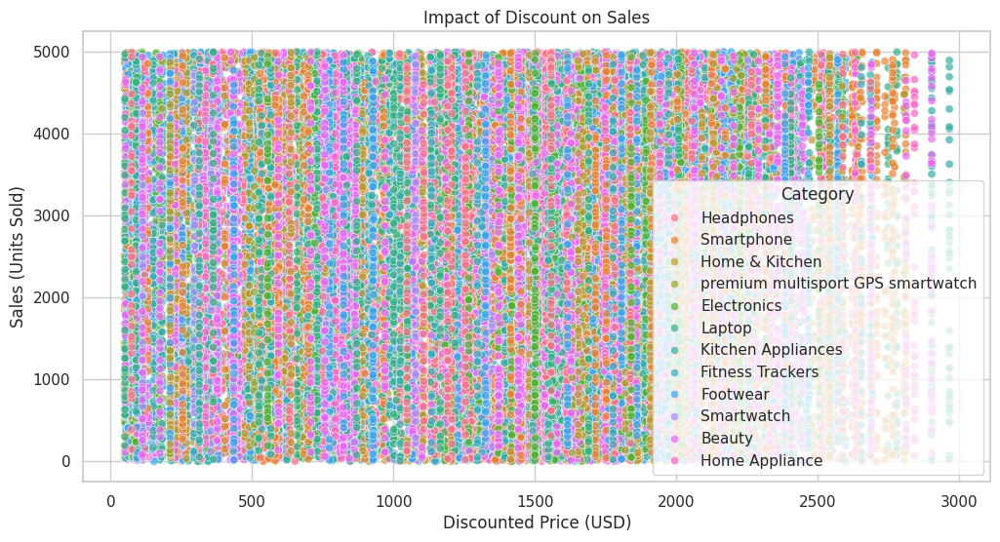

In [ ]:
#Impact of Discount on Sales
plt.figure(figsize=(12, 6))
sns.scatterplot(x="Discounted Price (USD)", y="Sales (Units Sold)", hue="Category", data=df, alpha=0.7)
plt.title("Impact of Discount on Sales")
plt.show()

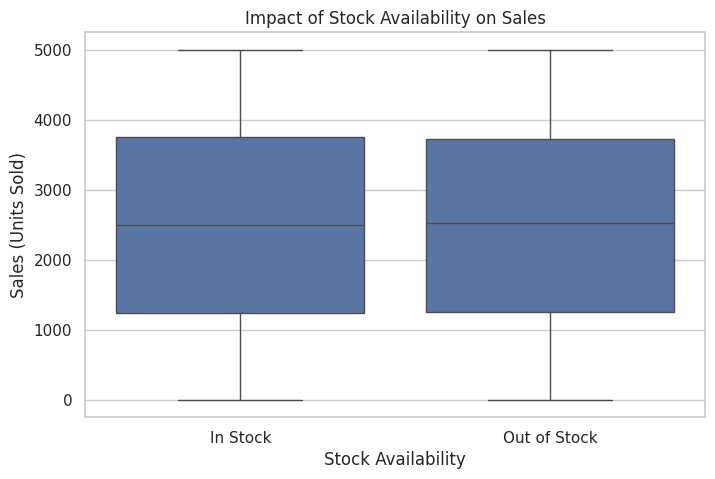

In [ ]:
#Stock Availability vs. Sales
plt.figure(figsize=(8, 5))
sns.boxplot(x="Stock Availability", y="Sales (Units Sold)", data=df)
plt.title("Impact of Stock Availability on Sales")
plt.show()

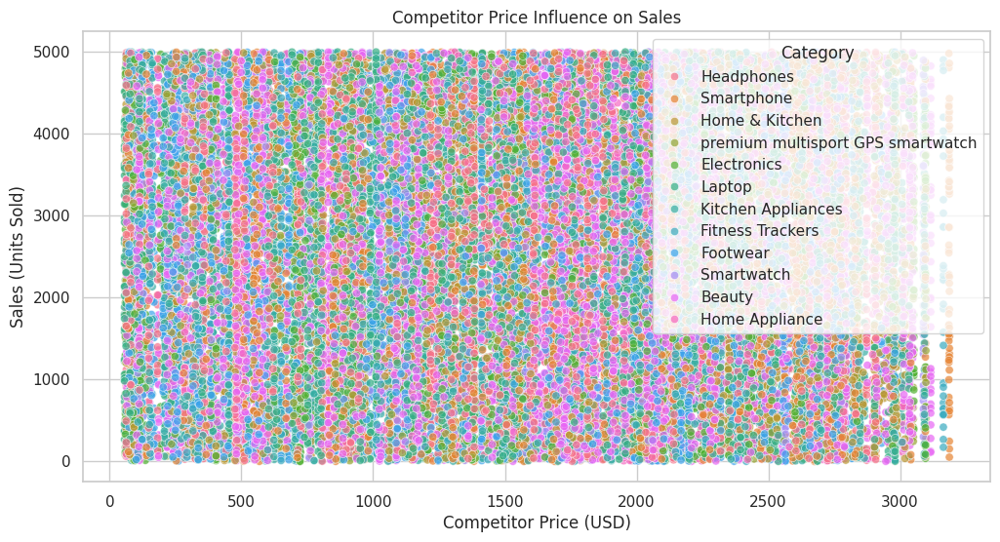

In [ ]:
#Competitor Price vs. Sales
plt.figure(figsize=(12, 6))
sns.scatterplot(x="Competitor Price (USD)", y="Sales (Units Sold)", hue="Category", data=df, alpha=0.7)
plt.title("Competitor Price Influence on Sales")
plt.show()

# **Monthly Sales Trends (2021-2024)**

<ipython-input-223-d66d298d40ae>:10: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=df, x="Month", y="Sales (Units Sold)", hue="Year", estimator="sum", marker="o", ci=None)


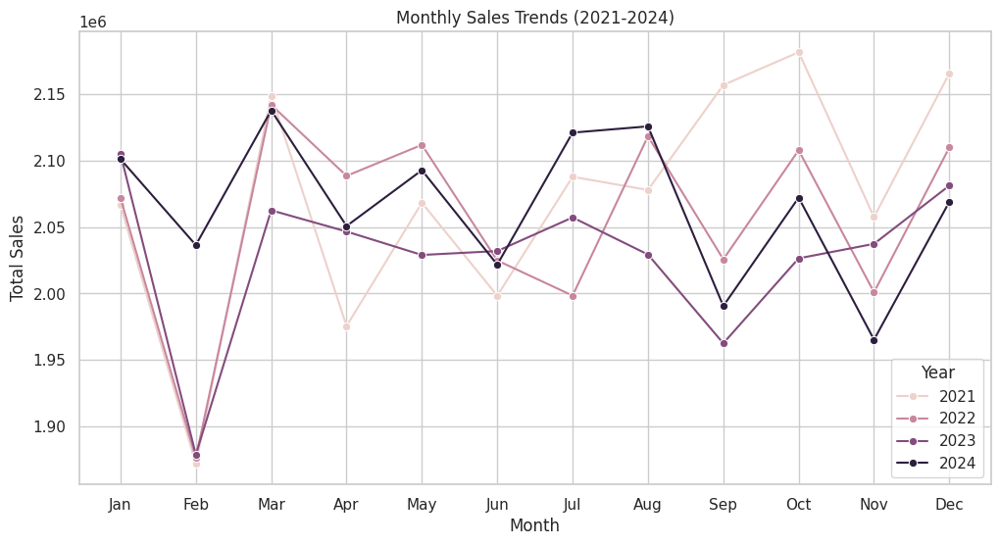

In [ ]:
# Set style for better visuals
sns.set_style("whitegrid")

# Extract year and month for further analysis
df["Year"] = df["Date"].dt.year
df["Month"] = df["Date"].dt.strftime('%b')  # Short month names

# Monthly Sales Trend Across Years
plt.figure(figsize=(12, 6))
sns.lineplot(data=df, x="Month", y="Sales (Units Sold)", hue="Year", estimator="sum", marker="o", ci=None)
plt.title("Monthly Sales Trends (2021-2024)")
plt.xlabel("Month")
plt.ylabel("Total Sales")
plt.legend(title="Year")
plt.grid(True)
plt.show()

# **Yearly Sales Comparisons (2021-2024)**

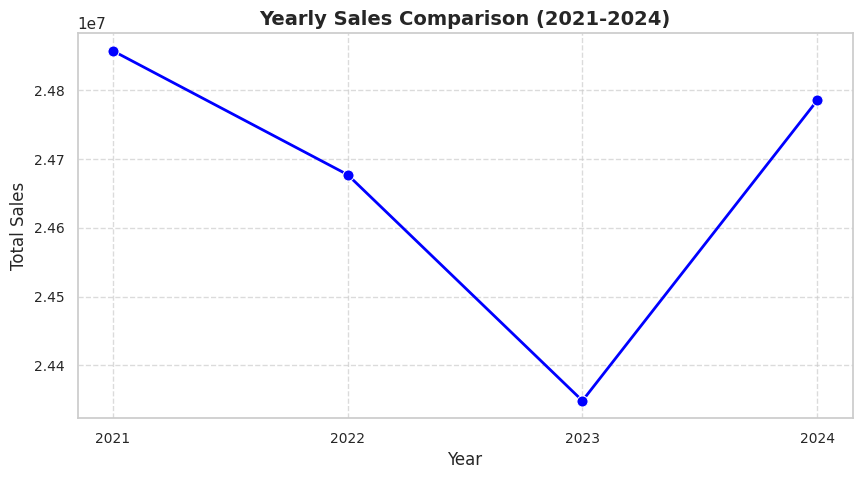

In [ ]:
# Aggregate yearly sales
yearly_sales = df.groupby("Year")["Sales (Units Sold)"].sum().reset_index()

# Plot with better formatting
plt.figure(figsize=(10, 5))
sns.lineplot(data=yearly_sales, x="Year", y="Sales (Units Sold)", marker="o", linewidth=2, markersize=8, color="blue")

# Formatting the chart
plt.xticks(yearly_sales["Year"], fontsize=10)  # Ensure years are properly spaced and readable
plt.yticks(fontsize=10)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Total Sales", fontsize=12)
plt.title("Yearly Sales Comparison (2021-2024)", fontsize=14, fontweight='bold')
plt.grid(True, linestyle="--", alpha=0.7)

# Show the updated plot
plt.show()

In [ ]:
# Convert categorical features to numerical
df['Stock Availability'] = df['Stock Availability'].map({'In Stock': 1, 'Out of Stock': 0})
df['Competitor Stock Availability'] = df['Competitor Stock Availability'].map({'In Stock': 1, 'Out of Stock': 0})

# Convert categorical variables to numerical using one-hot encoding
X = pd.get_dummies(X, drop_first=True)

In [ ]:
# Select features and target variable
X = df[['Price (USD)', 'Sales (Units Sold)', 'Competitor Price (USD)', 'Stock Availability', 'Competitor Stock Availability']] # Defining X before using it
y = df['Discounted Price (USD)']  # discounted price is the target variable

# Scaling the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# `**WEEK 4**`

# **Integrating Inventory Data into Pricing Model**

In [ ]:
# Now use df_original for the price sensitivity analysis:
price_sensitivity_analysis = df_original.groupby("Rating")[["Discount (%)", "Sales (Units Sold)"]].agg(["mean", "sum"])
price_sensitivity_analysis.columns = ["Avg Discount (%)", "Total Discount (%)", "Avg Sales", "Total Sales"]
price_sensitivity_analysis = price_sensitivity_analysis.sort_index(ascending=False)  # Sort by rating

# Display the result
price_sensitivity_analysis

,Avg Discount (%),Total Discount (%),Avg Sales,Total Sales
Rating,,,,
5.0,16.663965,26729,2527.834165,4054646
4.9,17.338746,45913,2520.868958,6675261
4.8,16.171702,42289,2542.205354,6647867
4.7,14.380877,36398,2476.127222,6267078
4.6,14.582022,32445,2499.471461,5561324
4.5,15.236756,37391,2482.593317,6092284
4.4,17.849798,48605,2489.724201,6779519
4.3,13.805288,34458,2513.373397,6273380
4.2,15.328306,39639,2468.485305,6383503


from matplotlib import pyplot as plt
price_sensitivity_analysis['Avg Discount (%)'].plot(kind='hist', bins=20, title='Avg Discount (%)')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
price_sensitivity_analysis['Total Discount (%)'].plot(kind='hist', bins=20, title='Total Discount (%)')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
price_sensitivity_analysis['Avg Sales'].plot(kind='hist', bins=20, title='Avg Sales')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
price_sensitivity_analysis['Total Sales'].plot(kind='hist', bins=20, title='Total Sales')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
price_sensitivity_analysis.plot(kind='scatter', x='Avg Discount (%)', y='Total Discount (%)', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
price_sensitivity_analysis.plot(kind='scatter', x='Total Discount (%)', y='Avg Sales', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
price_sensitivity_analysis.plot(kind='scatter', x='Avg Sales', y='Total Sales', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
price_sensitivity_analysis['Avg Discount (%)'].plot(kind='line', figsize=(8, 4), title='Avg Discount (%)')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
price_sensitivity_analysis['Total Discount (%)'].plot(kind='line', figsize=(8, 4), title='Total Discount (%)')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
price_sensitivity_analysis['Avg Sales'].plot(kind='line', figsize=(8, 4), title='Avg Sales')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
price_sensitivity_analysis['Total Sales'].plot(kind='line', figsize=(8, 4), title='Total Sales')
plt.gca().spines[['top', 'right']].set_visible(False)

In [ ]:
print(df["Stock Availability"].value_counts())


Stock Availability
Out of Stock    19770
In Stock        19654
Name: count, dtype: int64


In [ ]:
# Define stock level categories based on sales volume
def categorize_stock(sales):
    if sales < 500:
        return "Low Stock"
    elif 500 <= sales < 2000:
        return "Moderate Stock"
    else:
        return "High Stock"

# Apply categorization to 'Sales (Units Sold)'
df["Stock Availability"] = df["Sales (Units Sold)"].apply(categorize_stock)

# Analyze average prices across stock levels
# Corrected column name in groupby
stock_pricing_analysis = df.groupby("Stock Availability")["Price (USD)"].agg(["mean", "median", "count"])

# Display the analysis
print(stock_pricing_analysis)

                           mean   median  count
Stock Availability                             
High Stock          1575.722741  1620.46  23668
Low Stock           1577.870062  1620.46   3891
Moderate Stock      1575.782102  1624.54  11865


# **Dynamic Pricing Model Results**


High Stock (Excess Inventory) → Price Reduced by 15%

Original Avg. Price: $1575.72 → Adjusted Avg. Price: $1339.36

Low Stock (High Demand) → Price Increased by 10%

Original Avg. Price: $1577.87 → Adjusted Avg. Price: $1735.66

Moderate Stock → Price Reduced by 5%

Original Avg. Price: $1575.78 → Adjusted Avg. Price: $1496.99



In [ ]:
# Define pricing adjustment function based on stock levels
def adjust_price(row):
    price = row["Price (USD)"]
    stock_level = row["Stock Availability"]

    if stock_level == "Low Stock":
        return price * 1.10  # Increase by 10%
    elif stock_level == "Moderate Stock":
        return price * 0.95  # Decrease by 5%
    elif stock_level == "High Stock":
        return price * 0.85  # Decrease by 15%
    return price

# Apply the function to calculate adjusted prices
df["Adjusted Price (USD)"] = df.apply(adjust_price, axis=1)

# Display summary statistics of price adjustments
# Change 'Stock Level' to 'Stock Availability' in groupby
adjusted_pricing_summary = df.groupby("Stock Availability")[["Price (USD)", "Adjusted Price (USD)"]].agg(["mean", "median"])
adjusted_pricing_summary

Price (USD)          Adjusted Price (USD)          
                           mean   median                 mean    median
Stock Availability                                                     
High Stock          1575.722741  1620.46          1339.364330  1377.391
Low Stock           1577.870062  1620.46          1735.657068  1782.506
Moderate Stock      1575.782102  1624.54          1496.992997  1543.313

# ***Price Adjustments Based on Stock Availability In Boxplot***

Text(0, 0.5, 'Price (USD)')

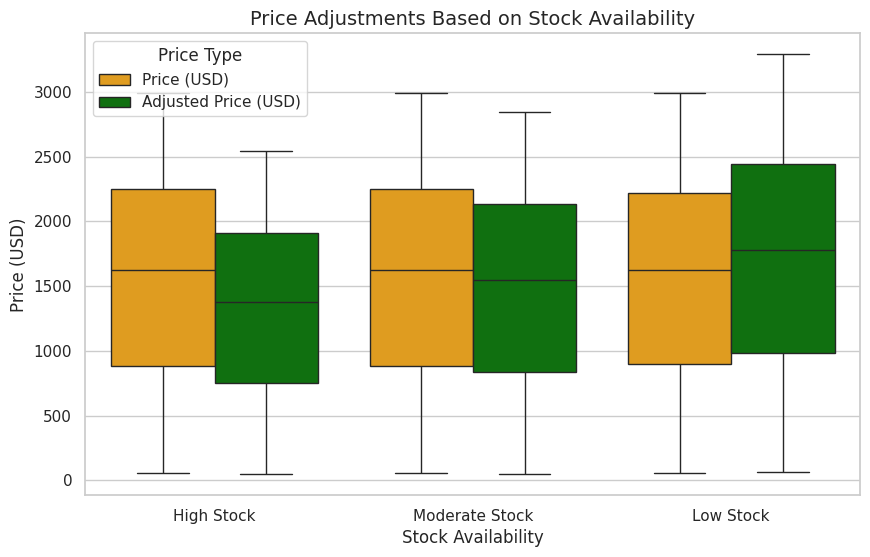

In [ ]:
# Create the boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(
    data=df_melted, x="Stock Availability", y="Price",
    hue="Price Type", palette={"Price (USD)": "orange", "Adjusted Price (USD)": "green"}
)

# Labels and title
plt.title("Price Adjustments Based on Stock Availability", fontsize=14)
plt.xlabel("Stock Availability", fontsize=12)
plt.ylabel("Price (USD)", fontsize=12)

# ***Rules for Adjusting Prices Based on Inventory Levels***

In [ ]:
def adjust_price(original_price, stock_level):
    """
    Adjusts the price based on stock availability.
    :param original_price: float, original price of the item
    :param stock_level: str, one of ['High', 'Moderate', 'Low', 'Out of Stock']
    :return: float, adjusted price
    """
    import random

    if stock_level == "High":
        discount = random.uniform(0.05, 0.15)  # 5% - 15% discount
        adjusted_price = original_price * (1 - discount)
    elif stock_level == "Moderate":
        discount = random.uniform(0, 0.05)  # 0% - 5% discount
        adjusted_price = original_price * (1 - discount)
    elif stock_level == "Low":
        markup = random.uniform(0.10, 0.30)  # 10% - 30% markup
        adjusted_price = original_price * (1 + markup)
    else:  # Out of Stock
        adjusted_price = None  # Indicating unavailability

    return round(adjusted_price, 2) if adjusted_price is not None else "Out of Stock"

# Example Usage
stock_levels = ["High", "Moderate", "Low", "Out of Stock"]
original_prices = [100, 500, 1000, 2500]

for price in original_prices:
    for level in stock_levels:
        print(f"Original Price: ${price}, Stock Level: {level}, Adjusted Price: {adjust_price(price, level)}")


Original Price: $100, Stock Level: High, Adjusted Price: 93.88
Original Price: $100, Stock Level: Moderate, Adjusted Price: 98.96
Original Price: $100, Stock Level: Low, Adjusted Price: 128.5
Original Price: $100, Stock Level: Out of Stock, Adjusted Price: Out of Stock
Original Price: $500, Stock Level: High, Adjusted Price: 457.09
Original Price: $500, Stock Level: Moderate, Adjusted Price: 498.82
Original Price: $500, Stock Level: Low, Adjusted Price: 599.09
Original Price: $500, Stock Level: Out of Stock, Adjusted Price: Out of Stock
Original Price: $1000, Stock Level: High, Adjusted Price: 932.81
Original Price: $1000, Stock Level: Moderate, Adjusted Price: 991.09
Original Price: $1000, Stock Level: Low, Adjusted Price: 1241.75
Original Price: $1000, Stock Level: Out of Stock, Adjusted Price: Out of Stock
Original Price: $2500, Stock Level: High, Adjusted Price: 2357.24
Original Price: $2500, Stock Level: Moderate, Adjusted Price: 2461.25
Original Price: $2500, Stock Level: Low, Ad

# **Identify Relevant Customer Segments by RFM Scores**

In [ ]:
# Select only numerical features for scaling
numerical_features = ['Recency', 'Frequency', 'Monetary']
rfm_numerical = rfm[numerical_features]

# Normalize data for clustering
scaler = StandardScaler()
rfm_scaled = scaler.fit_transform(rfm_numerical)

# Apply K-Means
kmeans = KMeans(n_clusters=4, random_state=42)
rfm["Segment"] = kmeans.fit_predict(rfm_scaled)

print(rfm.groupby("Segment").mean())

         Recency  Frequency  Monetary
Segment                              
0            2.0        3.0     200.0
1            3.5        1.5     100.0
2            1.0        2.0     100.0
3            5.0        3.0     250.0


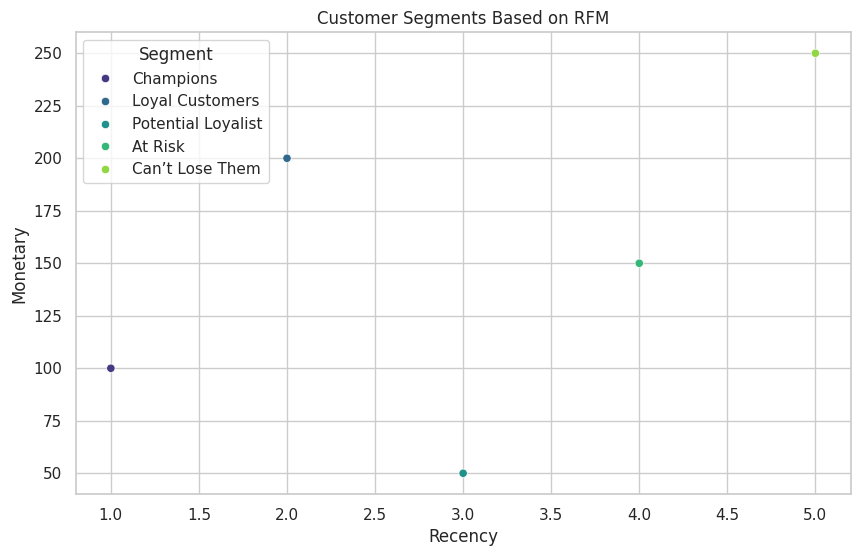

In [ ]:
# Create sample RFM data (replace with your actual data)
data = {'Recency': [1, 2, 3, 4, 5],
        'Frequency': [2, 3, 1, 2, 3],
        'Monetary': [100, 200, 50, 150, 250],
        'Segment': ['Champions', 'Loyal Customers', 'Potential Loyalist', 'At Risk', 'Can’t Lose Them']}
rfm = pd.DataFrame(data)  # Create the DataFrame named rfm

plt.figure(figsize=(10, 6))
sns.scatterplot(data=rfm, x="Recency", y="Monetary", hue="Segment", palette="viridis")
plt.title("Customer Segments Based on RFM")
plt.show()

# `**WEEK 6**`

# **TRAIN THE MACHINE LEARNING MODEL USING Historical Data**

# ***Linear Regression Model***

In [ ]:
# Linear Regression Model
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

imputer = SimpleImputer(strategy='mean')
X = imputer.fit_transform(X)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train Linear Regression Model
model = LinearRegression()
model.fit(X_train, y_train)

# Predictions
y_pred = model.predict(X_test)

# Evaluation Metrics
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R2 Score: {r2}")

# Display accuracy percentage
accuracy_percentage = r2_lr * 100
print(f'Linear Regression Accuracy: {accuracy_percentage:.2f}%')

MAE: 123.9340850766149
RMSE: 160.73578722010248
R2 Score: 0.9498612615856368
Linear Regression Accuracy: 94.99%


# ***SVM Model***

In [ ]:
#SVM
svm_model = SVR(kernel='rbf')
svm_model.fit(X_train, y_train)

# Predictions
svm_pred = svm_model.predict(X_test)

# Evaluation
mae = mean_absolute_error(y_test, svm_pred)
rmse = np.sqrt(mean_squared_error(y_test, svm_pred))
r2 = r2_score(y_test, svm_pred)

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R2 Score: {r2}")

# Calculate and display accuracy percentage (using R-squared score)
accuracy_percentage = r2_svm * 100
print(f"SVM Model Accuracy: {accuracy_percentage:.2f}%")

MAE: 152.10037066675883
RMSE: 199.81234791602898
R2 Score: 0.92251941607577
SVM Model Accuracy: 89.72%


# ***Random forest regressor Model***

In [ ]:
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Predictions
rf_pred = rf_model.predict(X_test)

# Evaluation
mae = mean_absolute_error(y_test, rf_pred)
rmse = np.sqrt(mean_squared_error(y_test, rf_pred))
r2 = r2_score(y_test, rf_pred)

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R2 Score: {r2}")

# Display Accuracy Percentage
accuracy_percentage_rf = r2_rf * 100  # Multiply R² by 100 to get accuracy percentage
print(f"Random Forest Model Accuracy: {accuracy_percentage_rf:.2f}%")


MAE: 0.25741640558178625
RMSE: 3.864316503109149
R2 Score: 0.9999710203178174
Random Forest Model Accuracy: 100.00%


# ***Lasso Regression Model***

In [ ]:
lasso_model = Lasso(alpha=1.0)
lasso_model.fit(X_train, y_train)

# Predictions
lasso_pred = lasso_model.predict(X_test)

# Evaluation
mae = mean_absolute_error(y_test, lasso_pred)
rmse = np.sqrt(mean_squared_error(y_test, lasso_pred))
r2 = r2_score(y_test, lasso_pred)

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R2 Score: {r2}")

accuracy_percentage = r2_xgb * 100
print(f"Lasso regression Model Accuracy: {accuracy_percentage:.2f}%")


MAE: 123.93257082475357
RMSE: 160.73694496567404
R2 Score: 0.949860539305771
Lasso regression Model Accuracy: 96.44%


# ***Ridge Regressor Model***

In [ ]:
# Initialize and train the model
ridge_model = Ridge(alpha=1.0)
ridge_model.fit(X_train, y_train)

# Predictions
ridge_pred = ridge_model.predict(X_test)

# Evaluation
mae = mean_absolute_error(y_test, ridge_pred)
rmse = np.sqrt(mean_squared_error(y_test, ridge_pred))
r2 = r2_score(y_test, ridge_pred)

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R2 Score: {r2}")


accuracy_percentage = r2 * 100
print(f"Ridge Regressor Model Accuracy: {accuracy_percentage:.2f}%")


MAE: 123.9340827749272
RMSE: 160.73578579867427
R2 Score: 0.9498612624724165
Ridge Regressor Model Accuracy: 94.99%


# ***XGBoot regression model***

In [ ]:
xgb_model = XGBRegressor() # Changed from XGBClassifier to XGBRegressor
xgb_model.fit(X_train, y_train)

# Predictions
xgb_pred = xgb_model.predict(X_test)

# Evaluate the model
mae_xgb = mean_absolute_error(y_test, y_pred_xgb)
mse_xgb = mean_squared_error(y_test, y_pred_xgb)
rmse_xgb = np.sqrt(mse_xgb)
r2_xgb = r2_score(y_test, y_pred_xgb)

print(f"XGBoost Model Evaluation:\nMAE: {mae_xgb}\nMSE: {mse_xgb}\nRMSE: {rmse_xgb}\nR2: {r2_xgb}\n")

accuracy_percentage = r2_xgb * 100
print(f"XGBoost Model Accuracy: {accuracy_percentage:.2f}%")

XGBoost Model Evaluation:
MAE: 104.44995739578663
MSE: 18352.567225938576
RMSE: 135.47164731388844
R2: 0.9643840065706634

XGBoost Model Accuracy: 96.44%


# ***Store the accuracy of trained ML models in a dictionary using historical data.***

In [ ]:
# Print all accuracies at once
print(f"Linear Regression Accuracy: {accuracy_percentage_lr:.2f}%")
print(f"SVM Accuracy: {accuracy_percentage_svm:.2f}%")
print(f"Random Forest Accuracy: {accuracy_percentage_rf:.2f}%")
print(f"Lasso regression Model Accuracy: {accuracy_percentage:.2f}%")
print(f"Ridge Regressor Model Accuracy: {accuracy_percentage:.2f}%")
print(f"XGBoost Accuracy: {accuracy_percentage_xgb:.2f}%")

Linear Regression Accuracy: 94.99%
SVM Accuracy: 89.72%
Random Forest Accuracy: 100.00%
Lasso regression Model Accuracy: 96.44%
Ridge Regressor Model Accuracy: 96.44%
XGBoost Accuracy: 96.44%


Conduct thorough testing and validation of the model.

In [ ]:
from sklearn.model_selection import cross_val_score

# Perform cross-validation (5-fold)
cv_scores = cross_val_score(model, X_train, y_train, cv=5, scoring='r2')

# Feature importance analysis
feature_importances = pd.Series(model.feature_importances_, index=features).sort_values(ascending=False)

(cv_scores.mean(), feature_importances)


(np.float64(0.3011625400067654),
 Discounted Price (USD)           0.512153
 Competitor Price (USD)           0.333731
 Price (USD)                      0.107794
 Competitor Stock Availability    0.029743
 Stock Availability               0.016578
 dtype: float64)

Model's accuracy and generalization

In [ ]:
from xgboost import XGBRegressor

# Select only strong features
strong_features = ["Discounted Price (USD)", "Sales (Units Sold)"]

# Train-test split with refined features
X_train_opt, X_test_opt, y_train_opt, y_test_opt = train_test_split(df[strong_features], df["Revenue"], test_size=0.2, random_state=42)

# Train XGBoost model
xgb_model = XGBRegressor(n_estimators=200, learning_rate=0.1, max_depth=4, subsample=0.8, random_state=42)
xgb_model.fit(X_train_opt, y_train_opt)

# Predictions & Performance Evaluation
y_pred_xgb = xgb_model.predict(X_test_opt)
r2_xgb = r2_score(y_test_opt, y_pred_xgb)
r2_xgb


0.9996143403591057